In [1]:
# %matplotlib notebook

In [2]:
import numpy as np
from matplotlib import pyplot as plt
import scipy
from sklearn.neighbors import KernelDensity
from math import pi
from math import exp
from scipy.integrate import quad
import torch
from tqdm import tqdm

# Plot tools

In [3]:
def get_NC_expec(unnorm_fX_fn):
    NC,_ = quad(unnorm_fX_fn, -np.inf, np.inf)
    expectation,_ = quad(lambda x: x*unnorm_fX_fn(x)/NC, -np.inf, np.inf)
    return NC, expectation

In [4]:
def plt_histogram(samples):
    plt.figure(figsize=(18,12))
    plt.hist(samples,bins=50)
    plt.show()

In [5]:
def plt_kernel_density_estimator_prob(samples, actual_pdf_fn=None, kernel='gaussian', bandwidth=0.5):
    plt.figure(figsize=(18,12))
    x_d = np.linspace(np.min(samples), np.max(samples),1000)
    if actual_pdf_fn is not None:
        # plt.fill_between(x_d, actual_pdf_fn(x_d), alpha=1.0, color='grey')
        plt.plot(x_d, actual_pdf_fn(x_d),'r--', label='actual target pdf')
        
    kde = KernelDensity(kernel=kernel, bandwidth=bandwidth).fit(samples[:,None])
    logprob = kde.score_samples(x_d[:,None])
    plt.fill_between(x_d, np.exp(logprob), alpha=0.5, label='pdf estimated(kernel density estimator)')
    plt.scatter(samples, np.zeros_like(samples), s=0.1)
    plt.legend(loc='upper right')
    plt.show()


# Naive sampling

## Discrete distribution

In [278]:
def naive_discrete_sampling(Px, N_samples):
    Xs = np.array([x for x in Px])
    
    '''Prepare cdf array'''
    cdf_vals = [0]
    val = 0
    for x in Xs:
        assert 0 <= Px[x] <= 1, "Invalid PMF passed!!!"
        val += Px[x]
        cdf_vals.append(val)
    cdf_vals = np.array(cdf_vals)
    assert val == 1, "Invalid discrete distribution passed!!!"
    
    '''Sample from a uniform distribution'''
    z = np.random.uniform(size=(N_samples,1))
    # print(z)
    
    ge_mask = z >= cdf_vals[:-1]
    le_mask = z <= cdf_vals[1:]
    overall_mask = ge_mask&le_mask 
    # print(overall_mask)
    samples = Xs[np.argmax(overall_mask, axis=1)]
    plt_histogram(samples)
    return samples

    
    

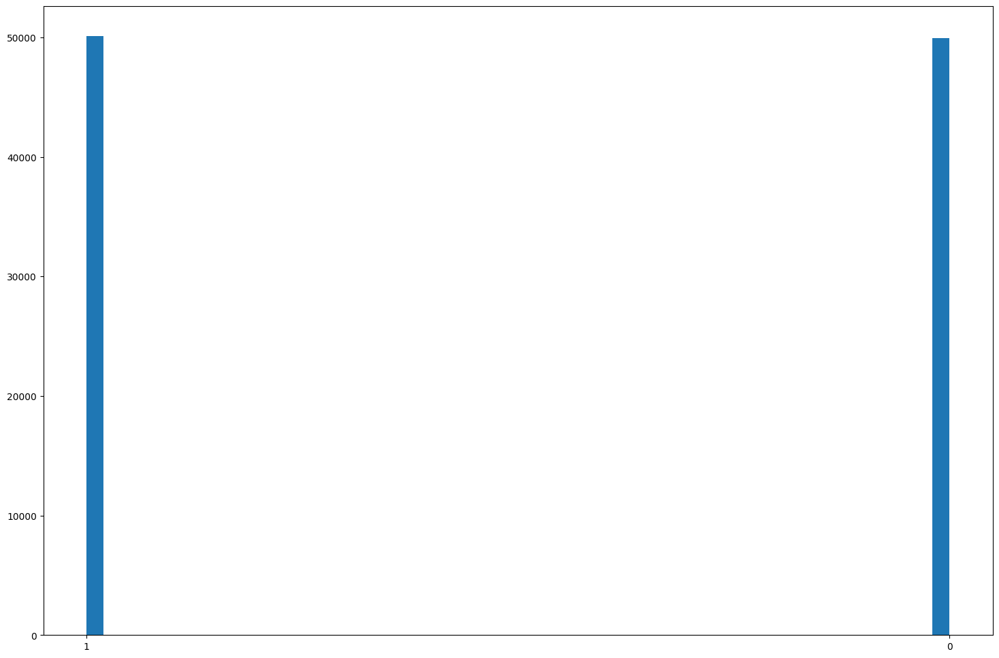

In [279]:
samples = naive_discrete_sampling({'0':0.5,'1':0.5},100000)

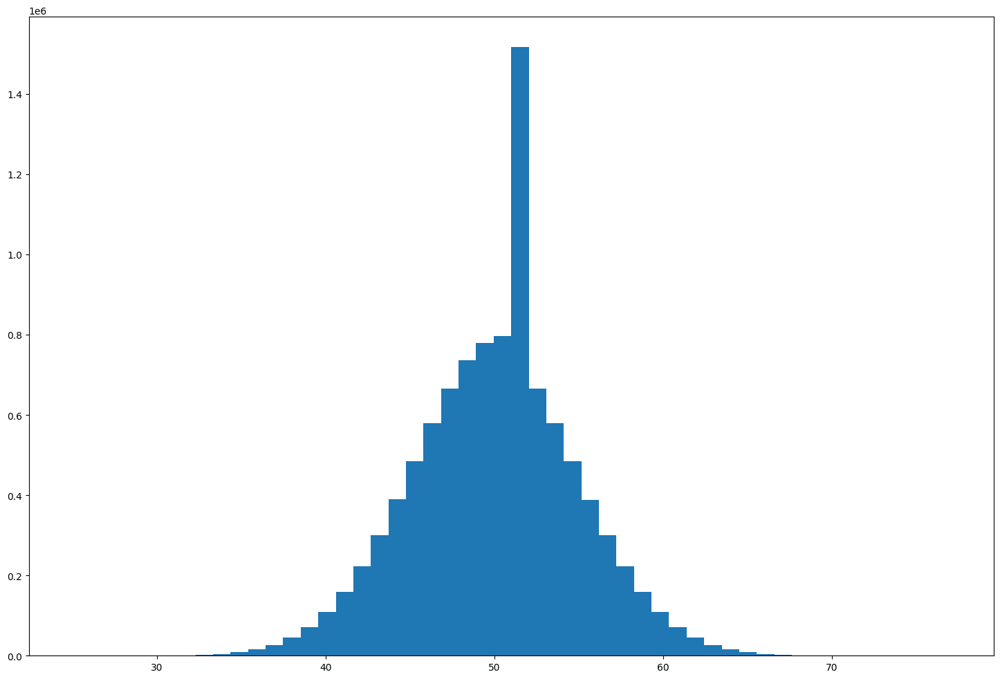

50.0007769

In [280]:
n = 100
p=0.5
Px = dict([(i,scipy.stats.binom.pmf(i,n,p)) for i in range(n+1)])
samples = naive_discrete_sampling(Px, 10000000)
np.mean(samples)

## Naive Continuous Sampling

In [281]:
def naive_continuous_sampling(inv_Fx_fn, N_samples, pdf_fn=None):
    z = np.random.uniform(size=N_samples)
    samples = inv_Fx_fn(z)
    plt_histogram(samples)
    if pdf_fn is not None:
        plt_kernel_density_estimator_prob(samples, pdf_fn, kernel='gaussian', bandwidth=0.1)
    return samples
    

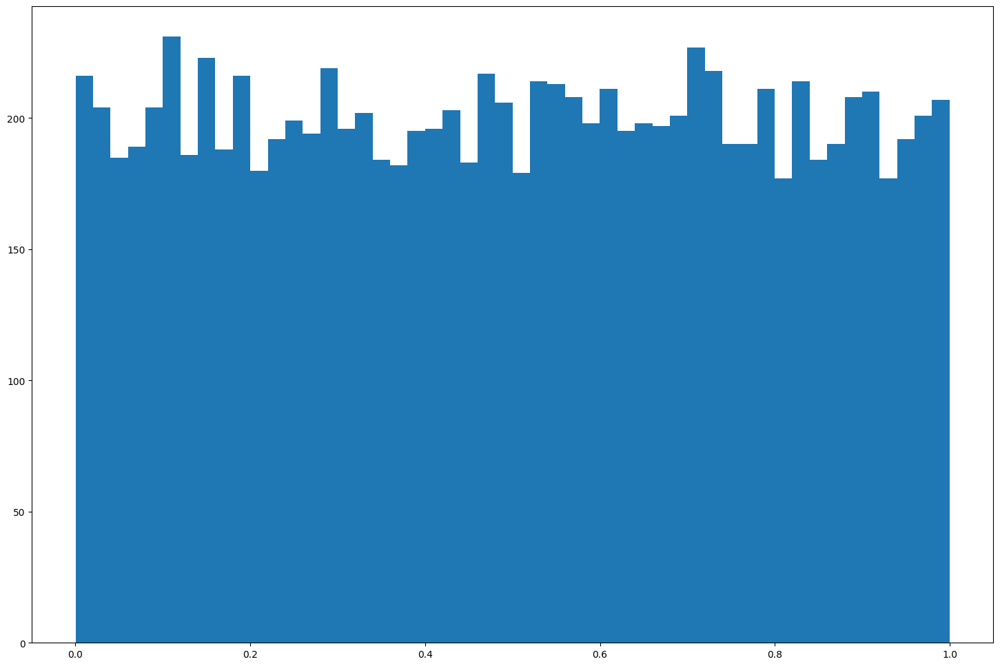

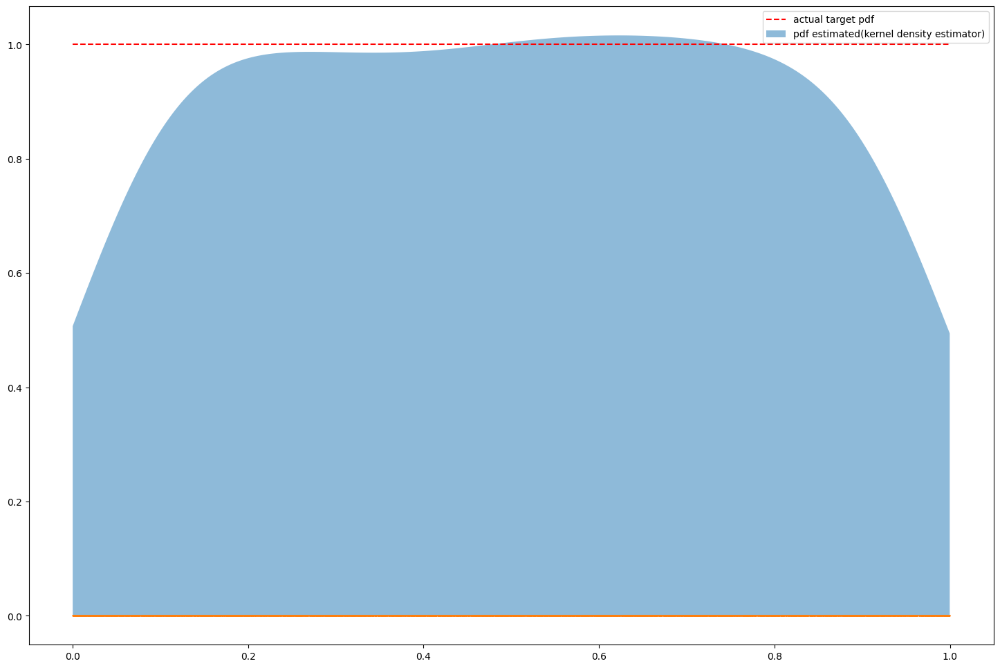

In [282]:
inv_Fx_fn = lambda x: x
pdf_fn = lambda x: np.ones_like(x)
samples = naive_continuous_sampling(inv_Fx_fn, 10000, pdf_fn)

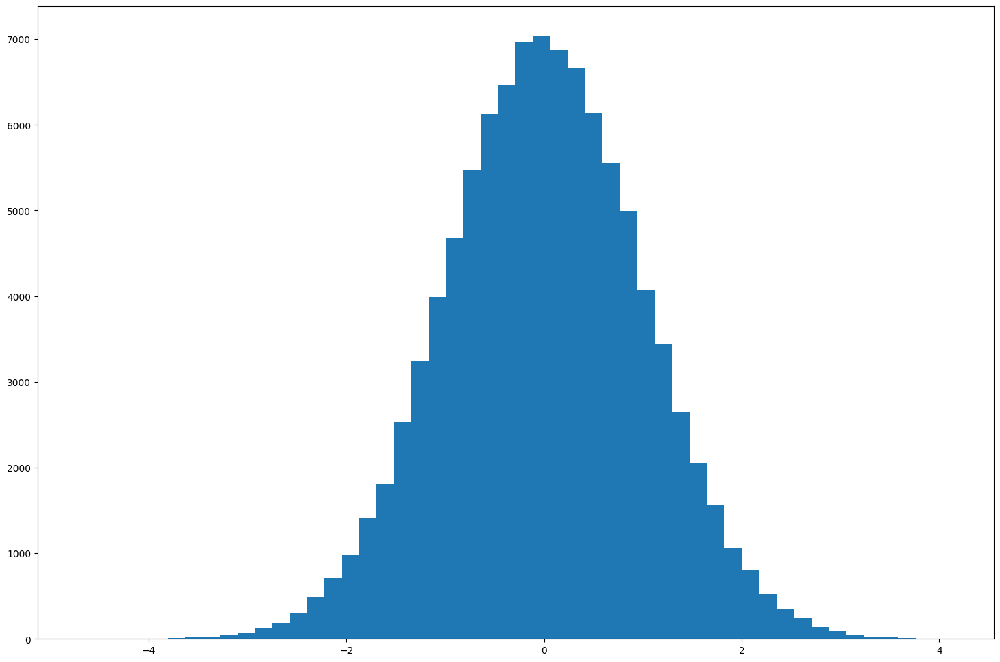

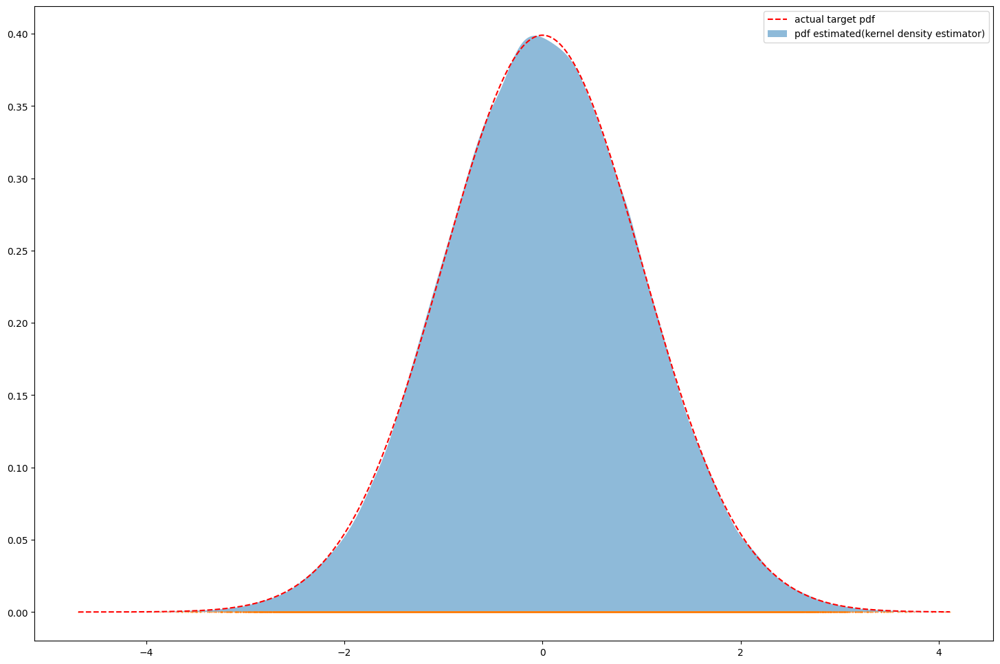

In [289]:
inv_Fx_fn = scipy.stats.norm.ppf
pdf_fn = scipy.stats.norm.pdf
samples = naive_continuous_sampling(inv_Fx_fn, 100000, pdf_fn)

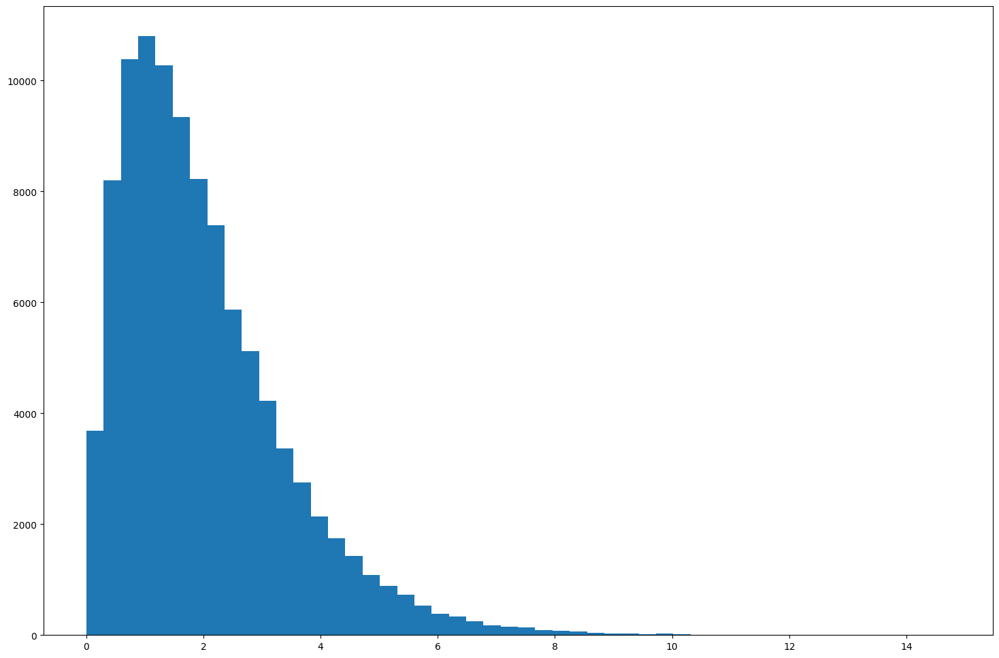

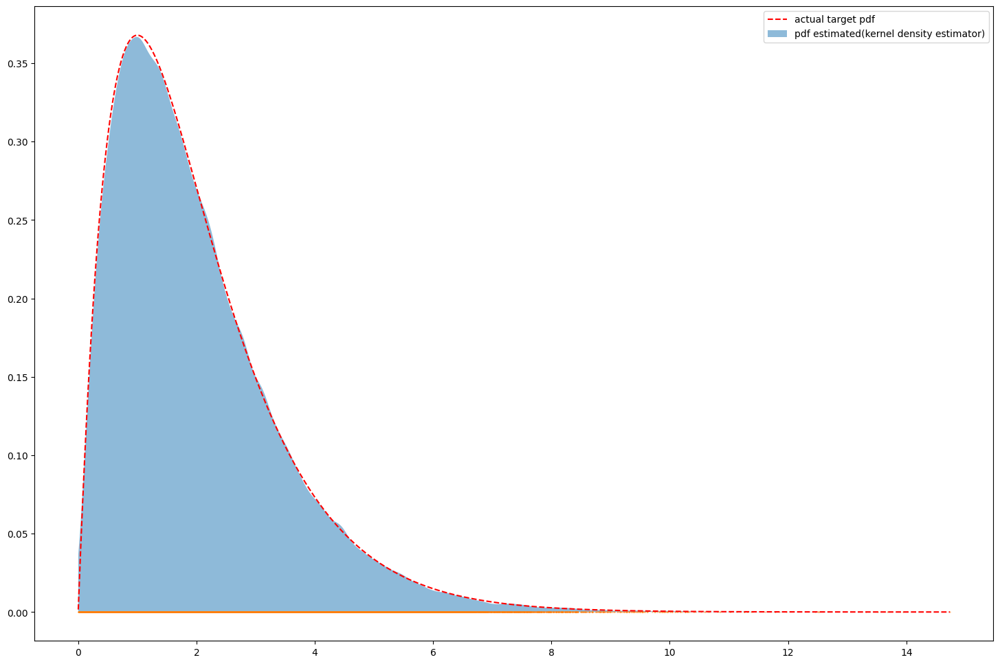

In [284]:
inv_Fx_fn = lambda x: scipy.stats.gamma.ppf(x,2)
pdf_fn = lambda x: scipy.stats.gamma.pdf(x,2)
samples = naive_continuous_sampling(inv_Fx_fn, 100000, pdf_fn)


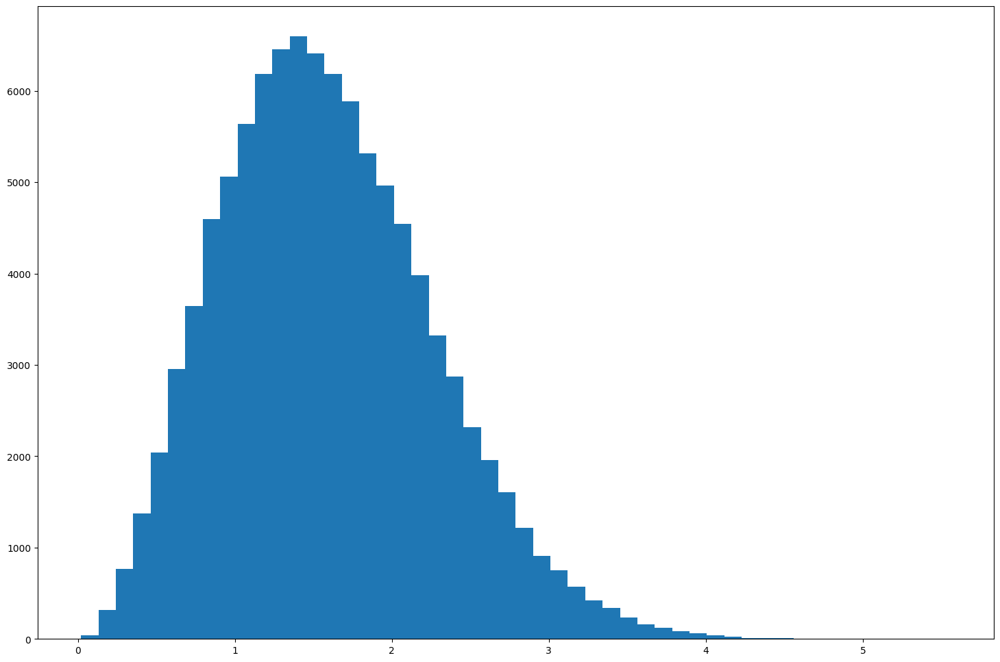

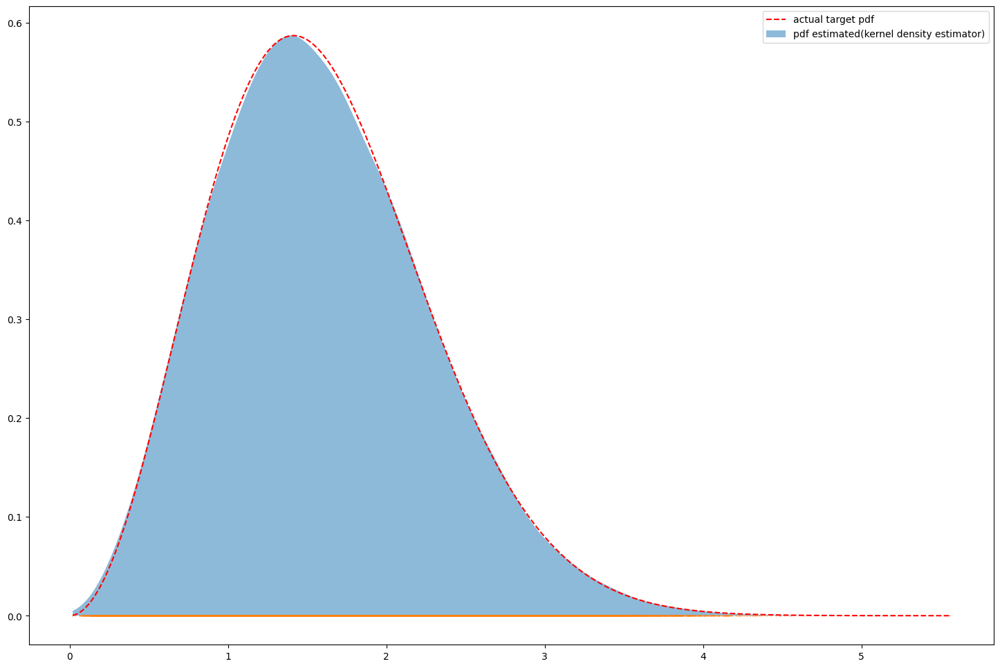

In [285]:
inv_Fx_fn = lambda x: scipy.stats.chi.ppf(x,3)
pdf_fn = lambda x: scipy.stats.chi.pdf(x,3)
samples = naive_continuous_sampling(inv_Fx_fn, 100000, pdf_fn)


# Rejection Sampling

## Mixture of two gaussian

In [286]:
def rejection_sampling(unnorm_fX_fn, gX_fn, gSamples_fn, N_samples=10000, xs_range=[-20,20]):
    xs = np.linspace(xs_range[0],xs_range[1],1000)
    '''Compute the scaling factor'''
    c = np.max(unnorm_fX_fn(xs)/gX_fn(xs))
    plt.figure(figsize=(18,12))
    plt.plot(xs, unnorm_fX_fn(xs),'k-' , label='unnormalized target pdf')
    plt.plot(xs, gX_fn(xs), 'g-', label='proxy pdf' )
    plt.plot(xs, c*gX_fn(xs), 'g-', label='scaled proxy pdf')
    plt.legend(loc='upper right')
    plt.show()
    # print(c)

    samples = []
    while len(samples) < N_samples:
        z = gSamples_fn(1)[0]
        u = np.random.uniform(size=1)[0]
        # print(z,u,unnorm_fX_fn(z)/(c*gX_fn(z)), len(samples))
        # return samples
        if u <= unnorm_fX_fn(z)/(c*gX_fn(z)):
            samples.append(z)
    samples = np.array(samples)
    plt_histogram(samples)
    NC, _ = get_NC_expec(unnorm_fX_fn)
    plt_kernel_density_estimator_prob(samples, lambda x: unnorm_fX_fn(x)/NC, bandwidth=0.5)
    return z
        
        
        

Sampling 10 points using rejection sampling...


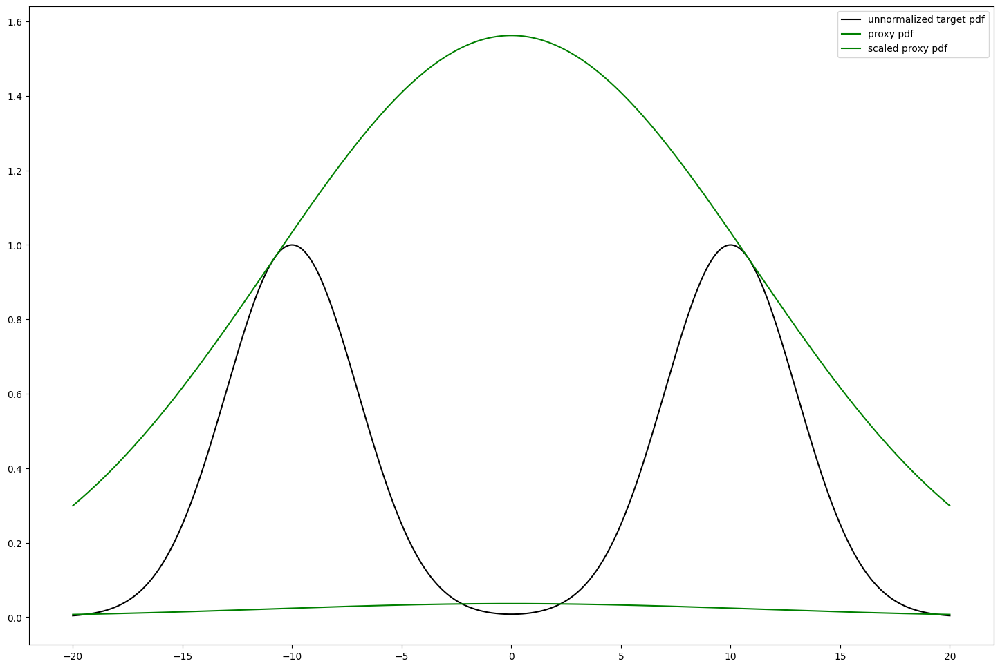

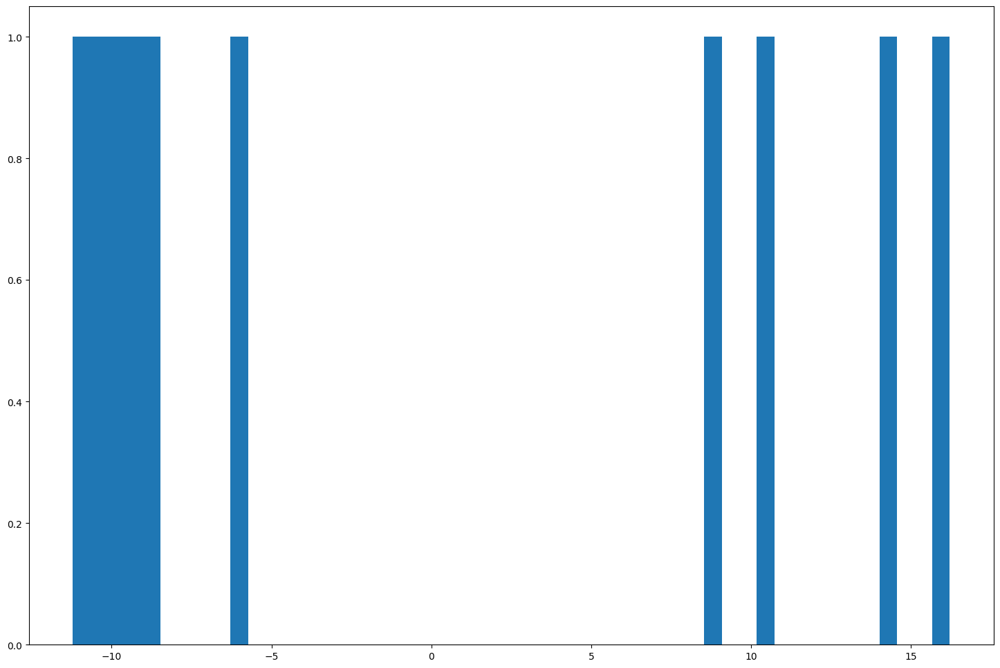

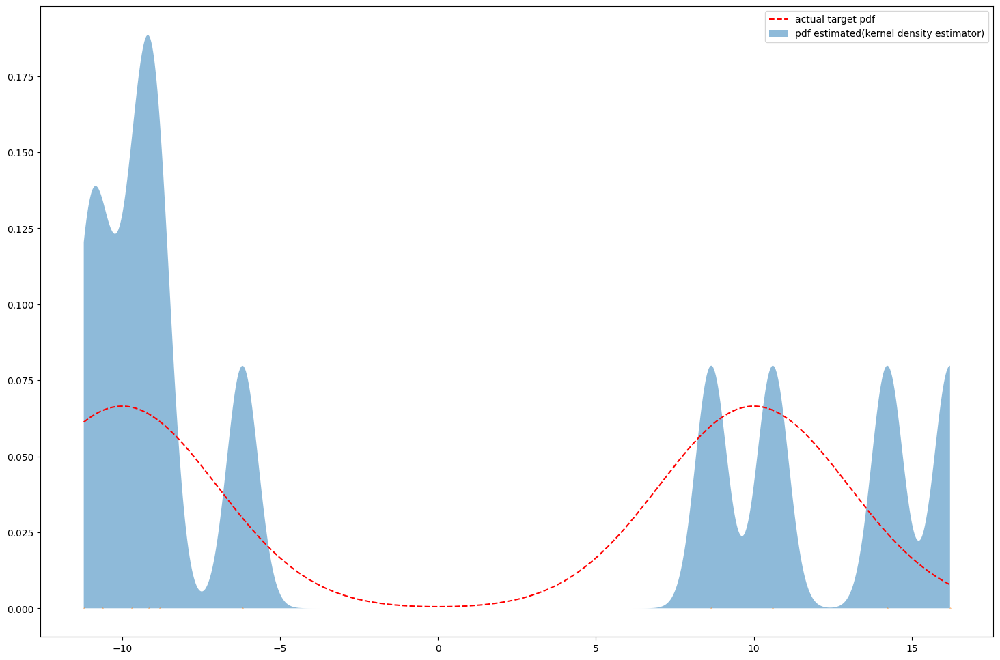

Sampling 100 points using rejection sampling...


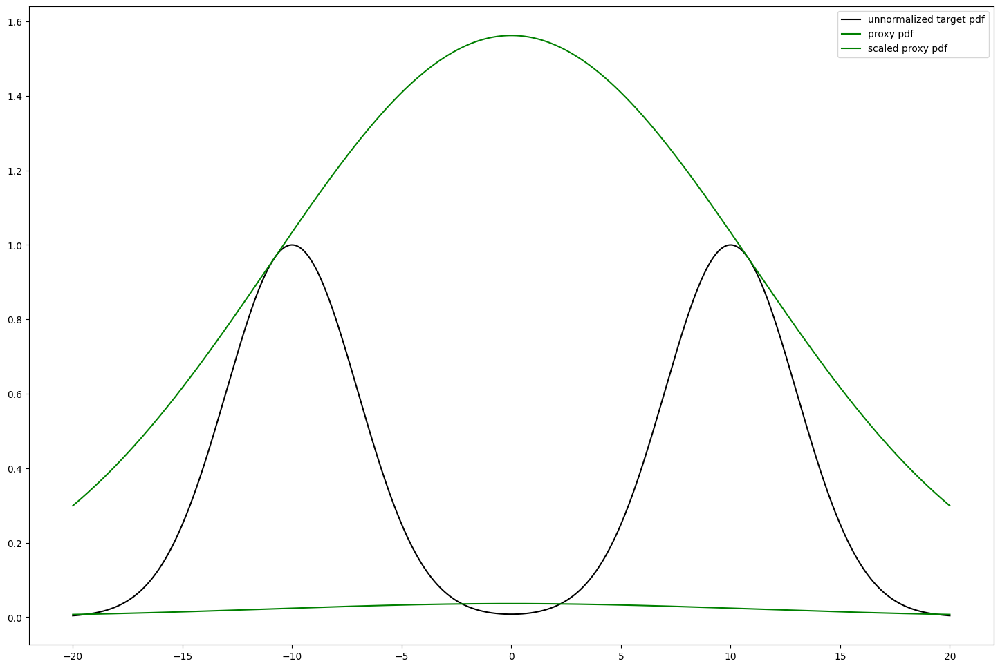

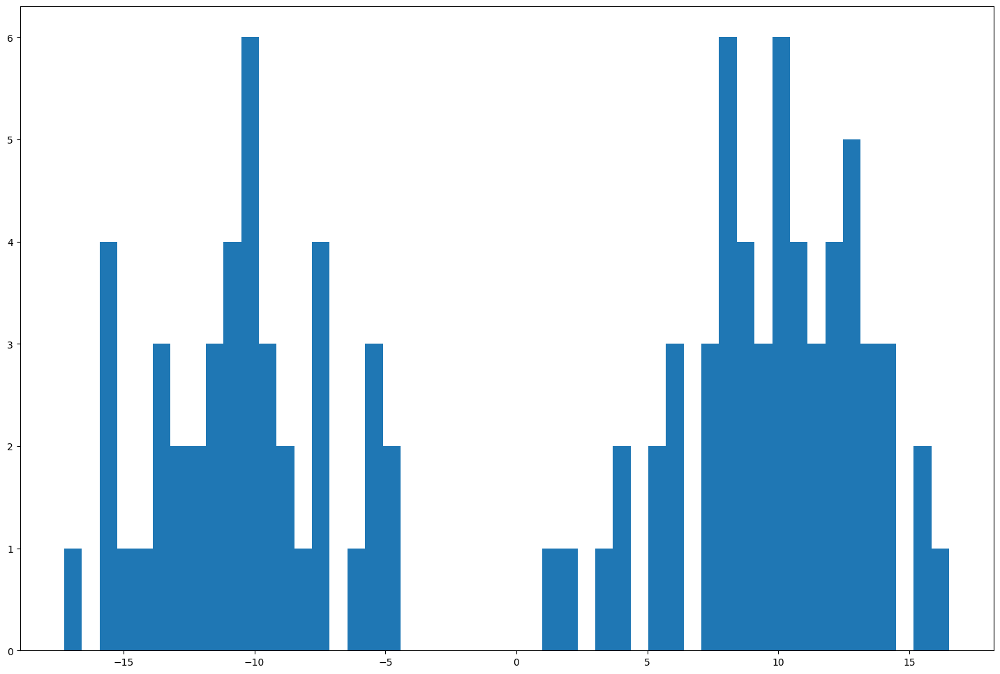

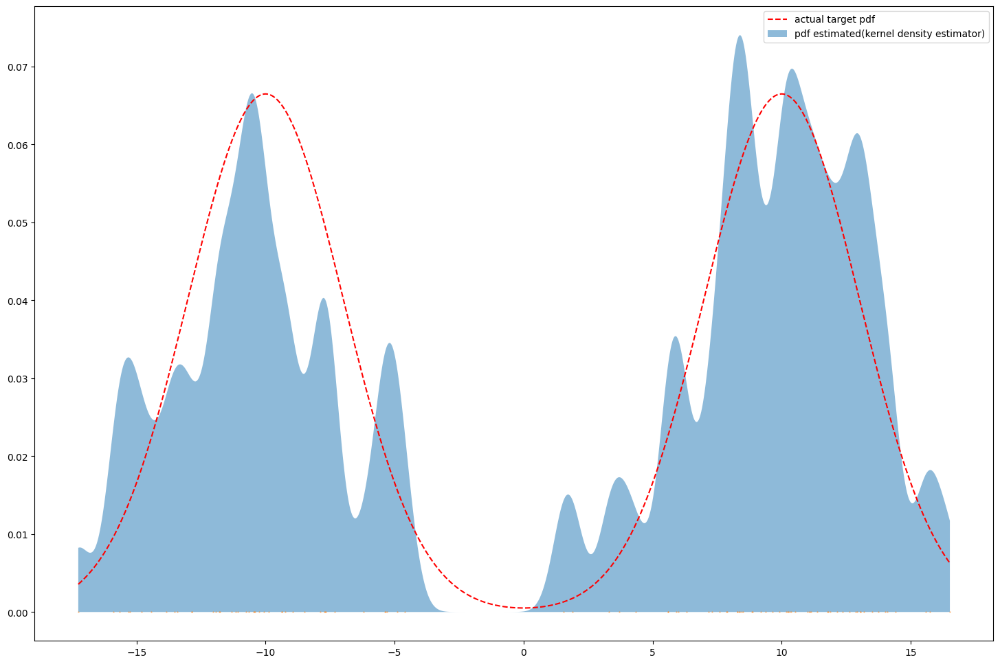

Sampling 1000 points using rejection sampling...


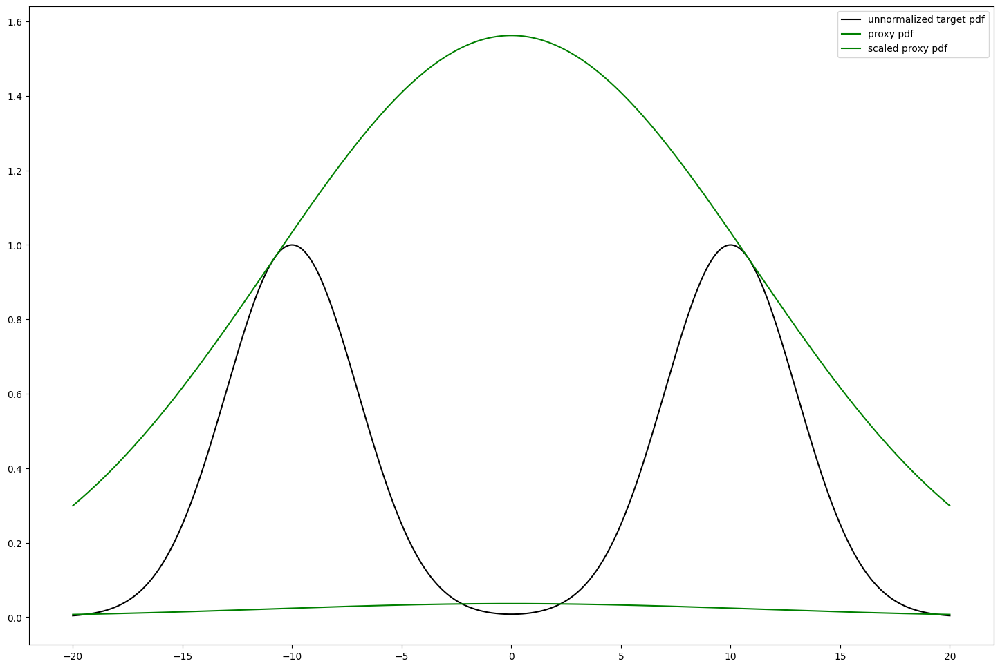

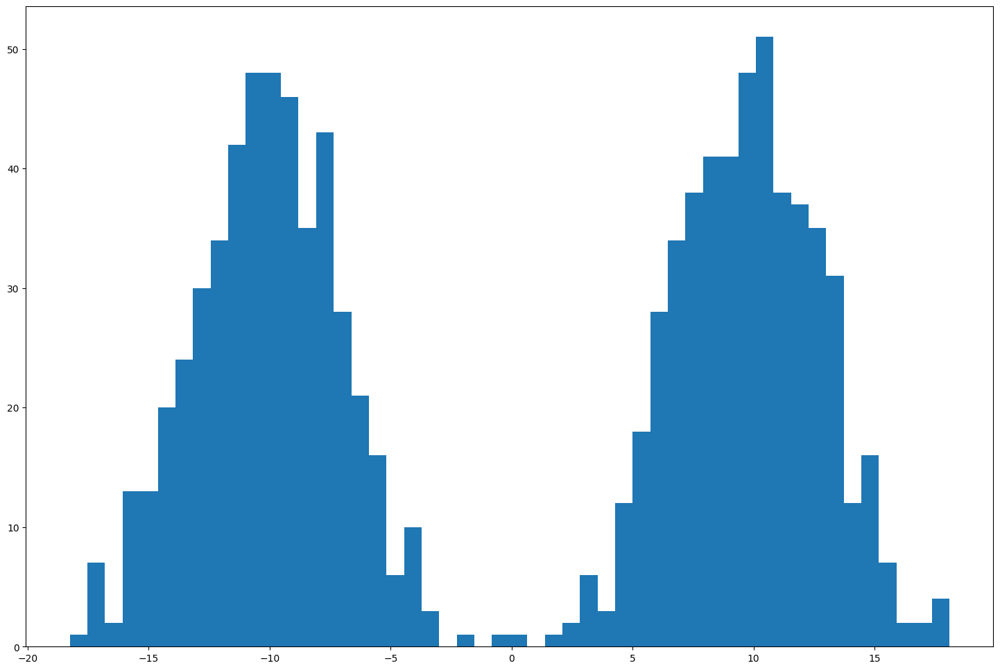

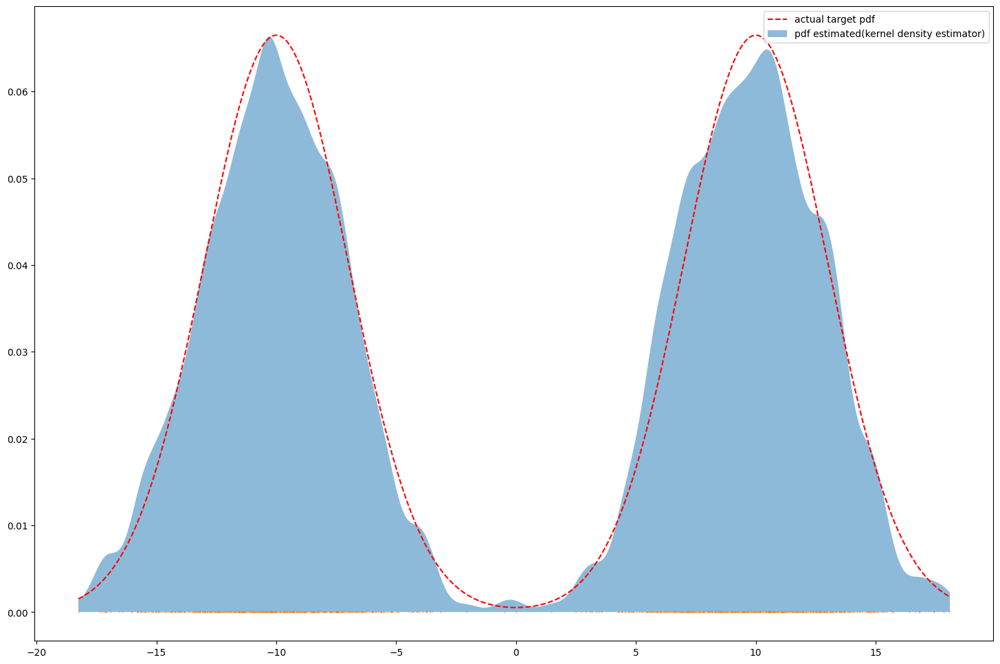

Sampling 10000 points using rejection sampling...


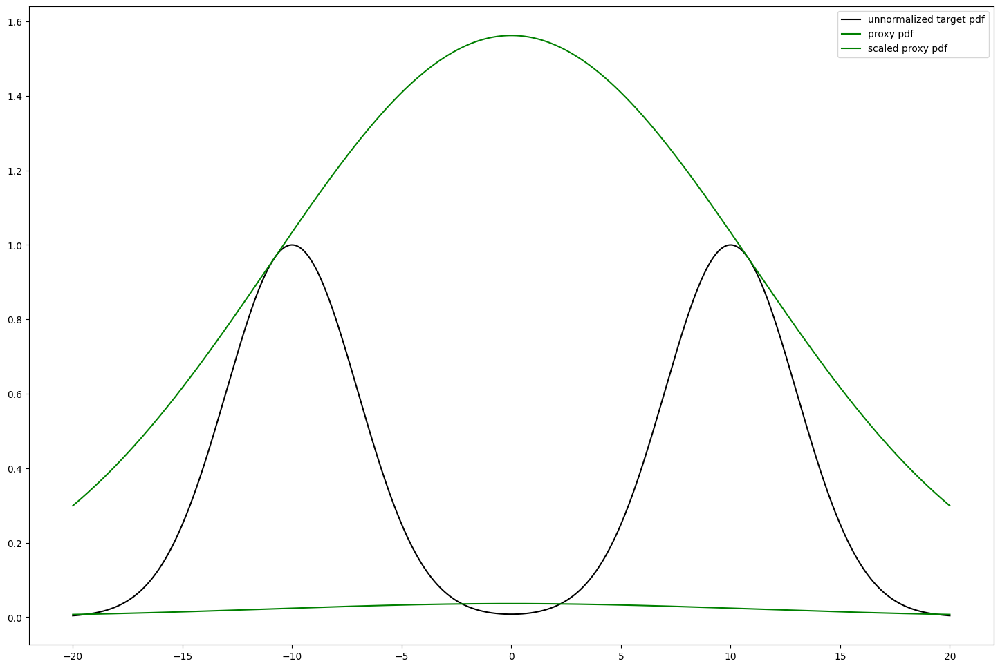

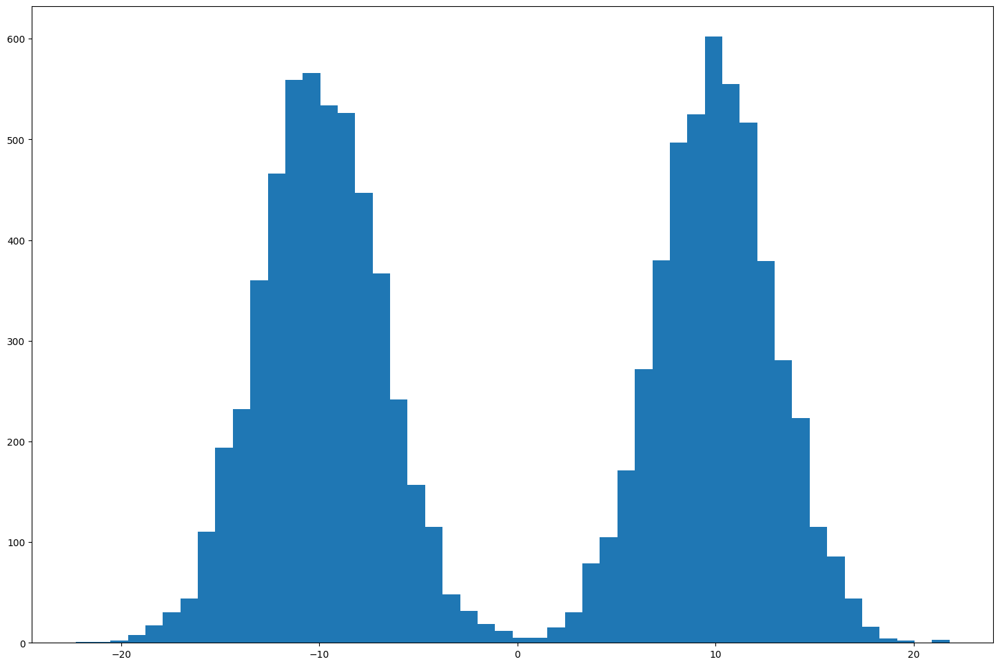

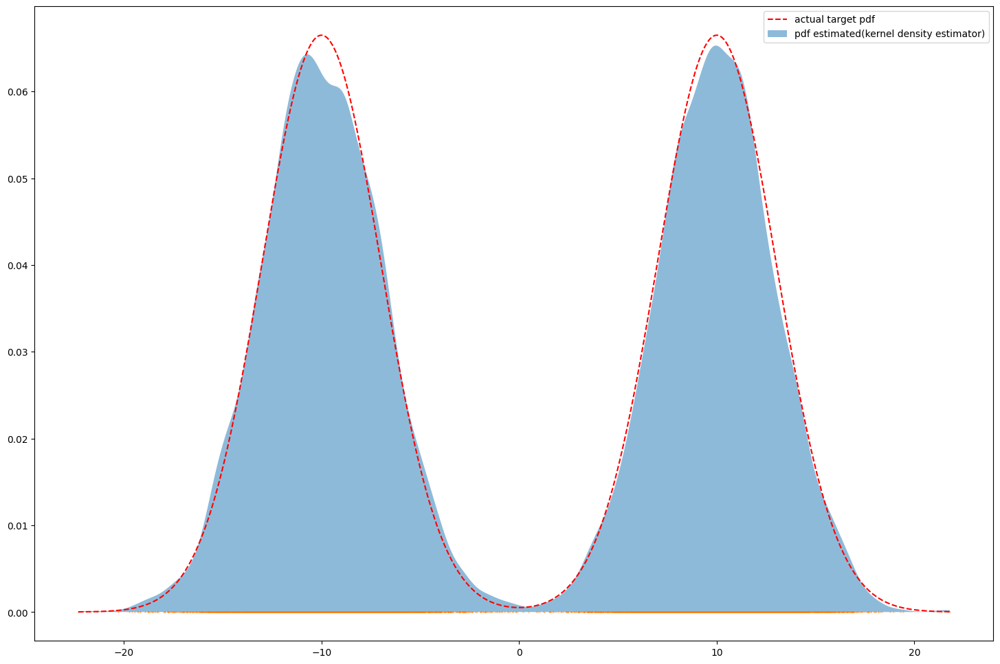

Sampling 100000 points using rejection sampling...


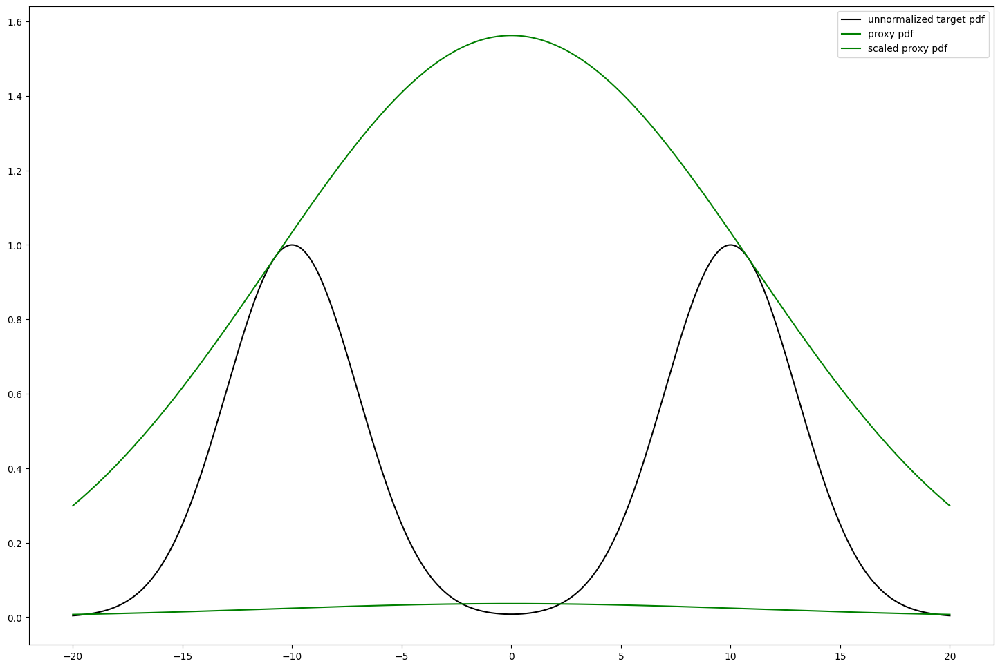

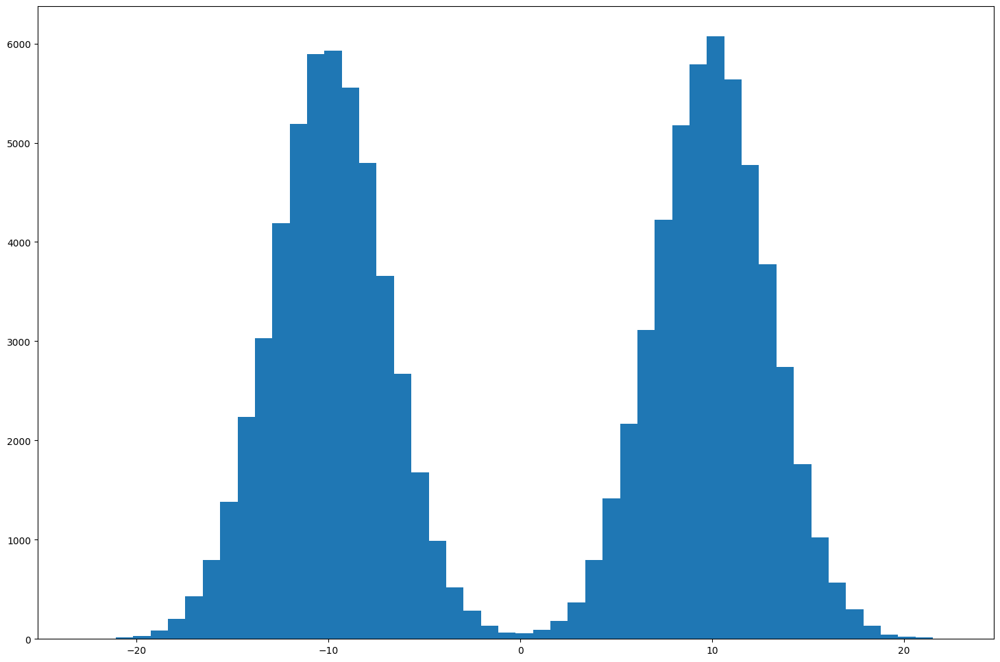

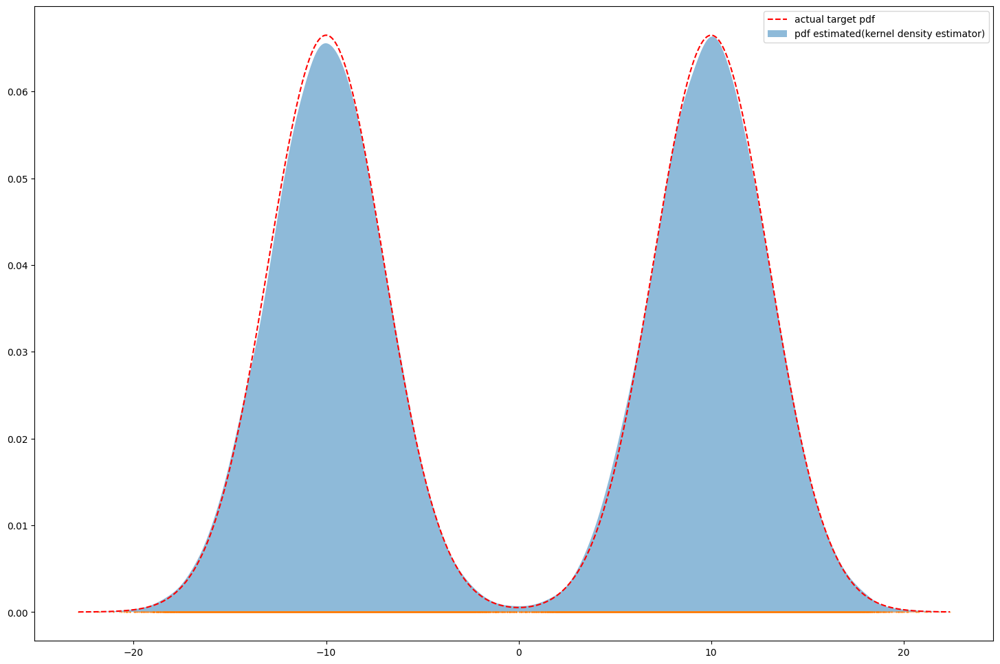

In [287]:
xs = np.linspace(-20,20,1000)
fX_fn = lambda x: np.exp(-1/2/(3**2)*((x+10)**2)) + np.exp(-1/2/(3**2)*((x-10)**2))
# NC_f = (2*pi)**0.5 * (3+3)

g_dist = scipy.stats.norm
gX_fn = lambda x: g_dist.pdf(x,scale=11)
gSamples_fn = lambda N: g_dist.rvs(scale=11,size=N)

for N in [10**i for i in range(1,6)]:
    print(f"Sampling {N} points using rejection sampling...")
    samples = rejection_sampling(fX_fn, gX_fn, gSamples_fn, N_samples=N)

Sampling 10 points using rejection sampling...


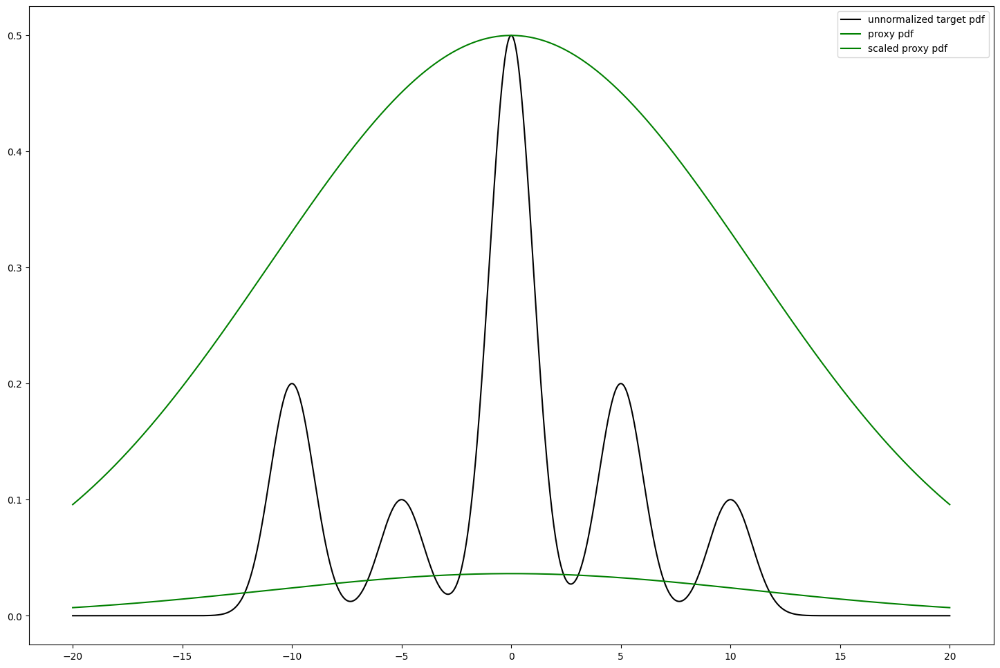

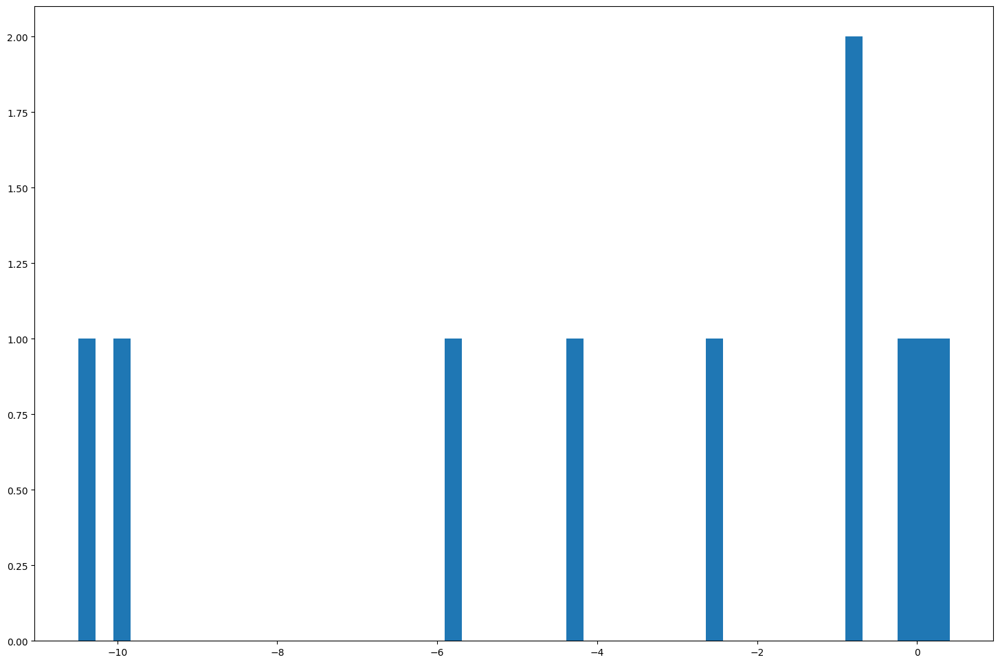

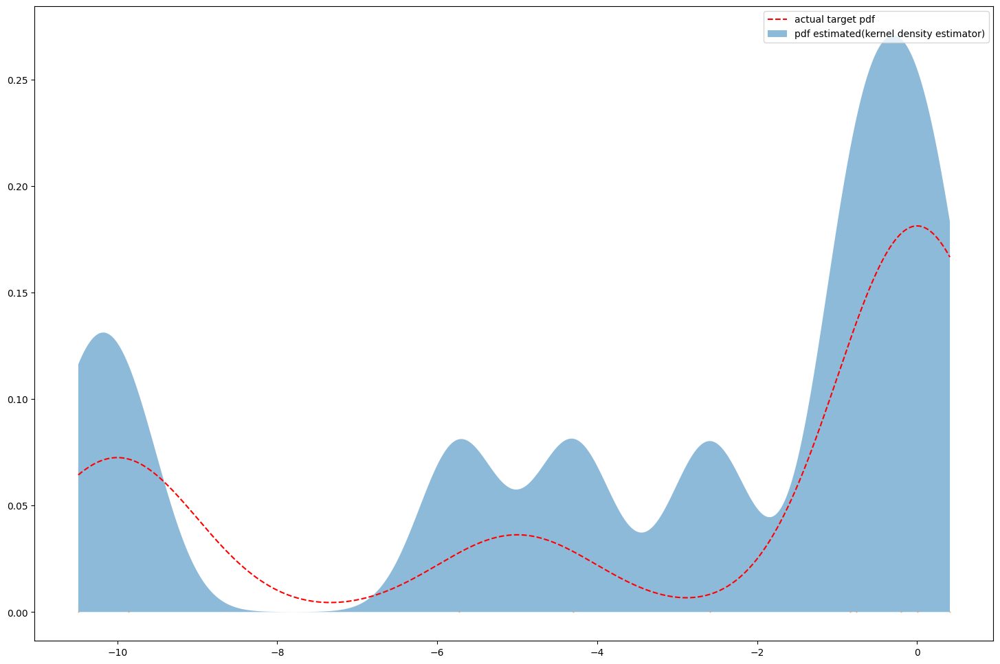

Sampling 100 points using rejection sampling...


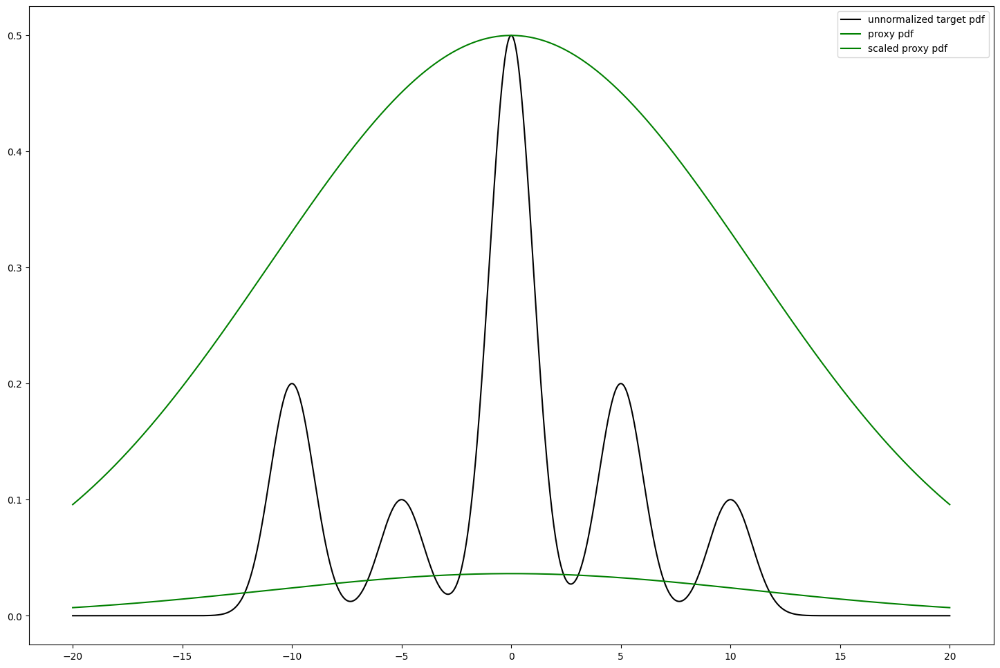

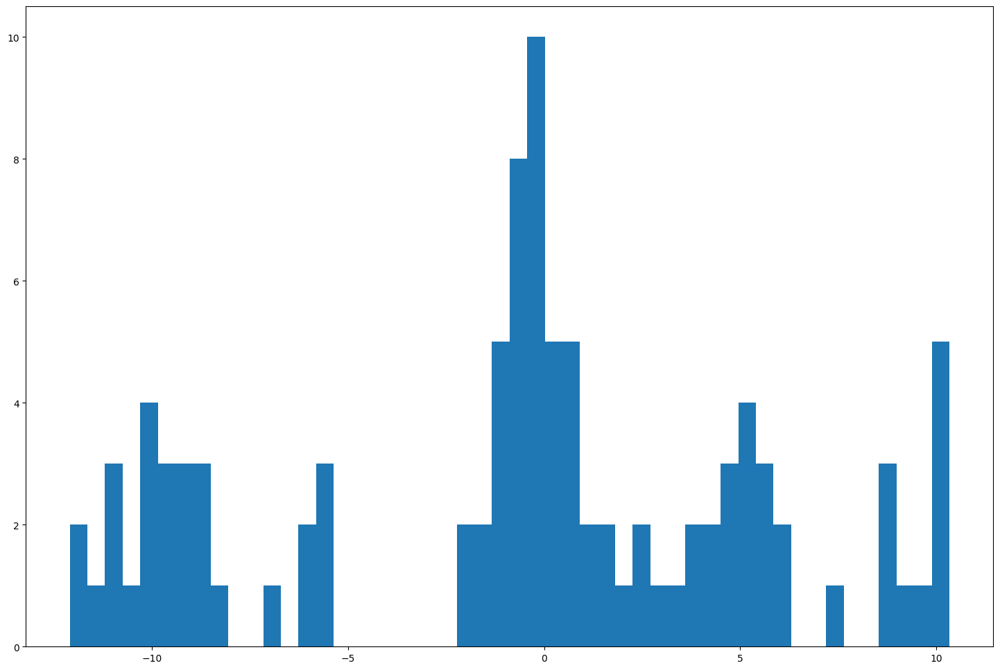

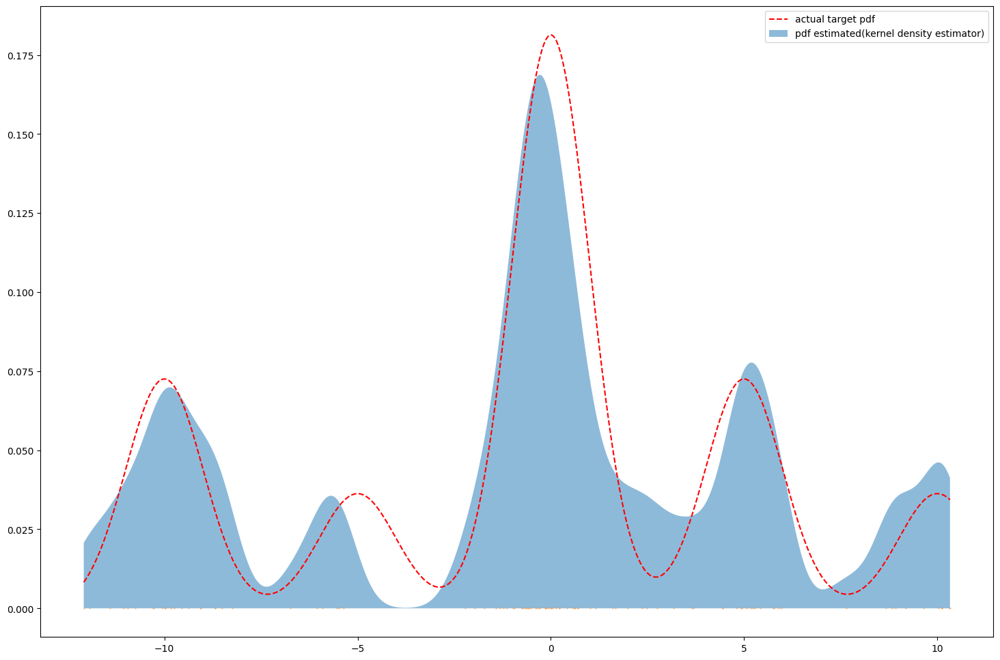

Sampling 1000 points using rejection sampling...


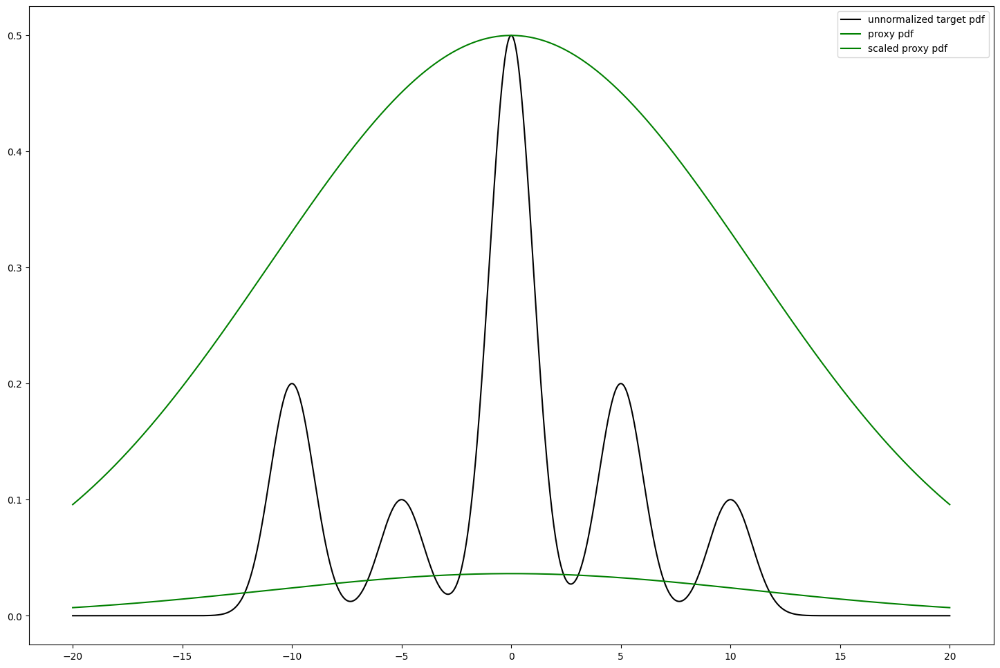

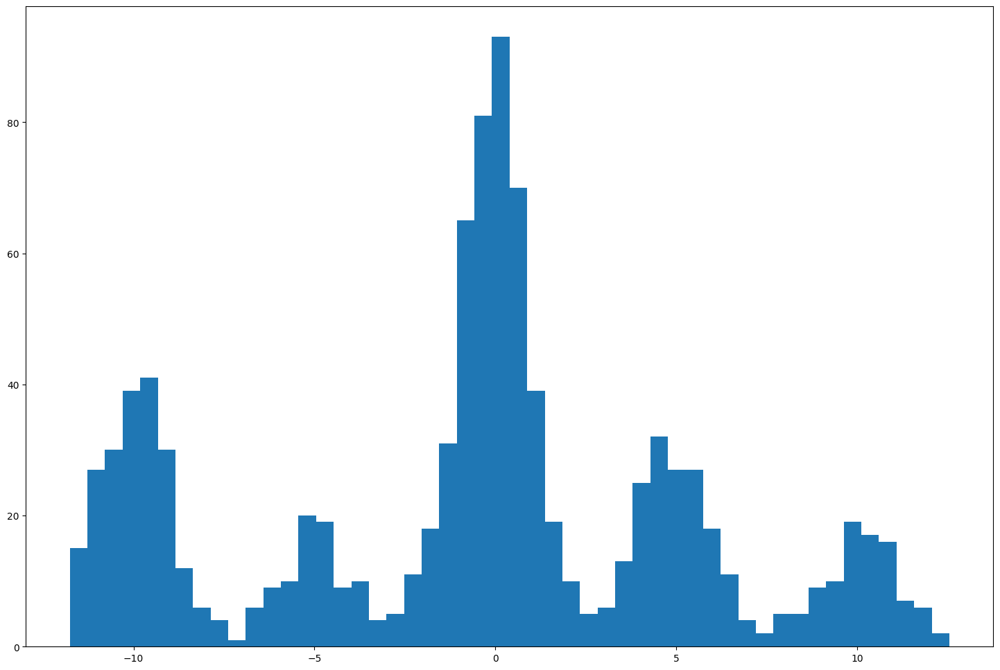

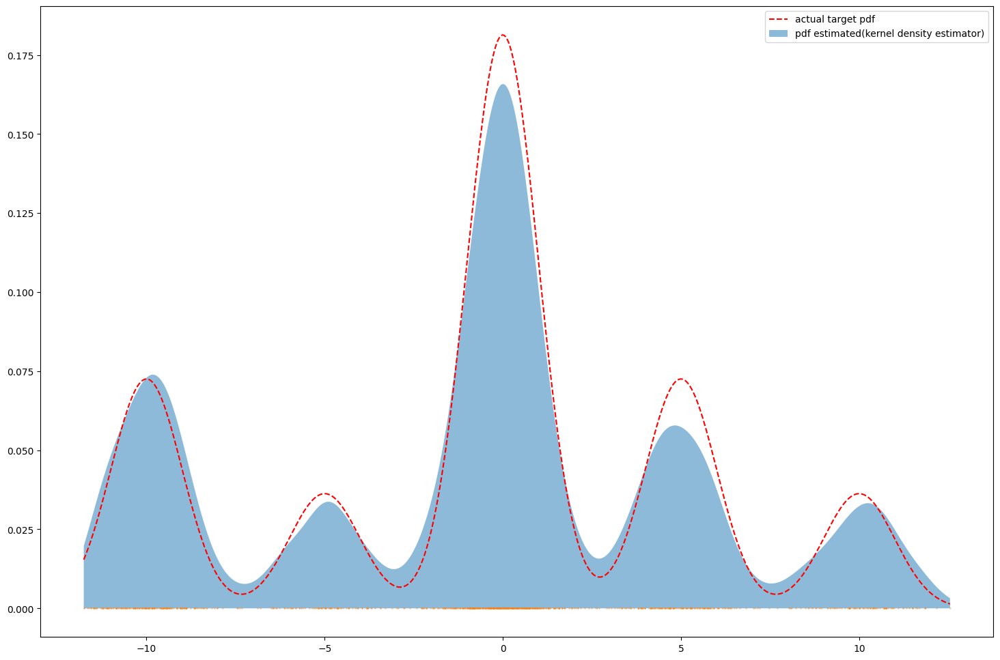

Sampling 10000 points using rejection sampling...


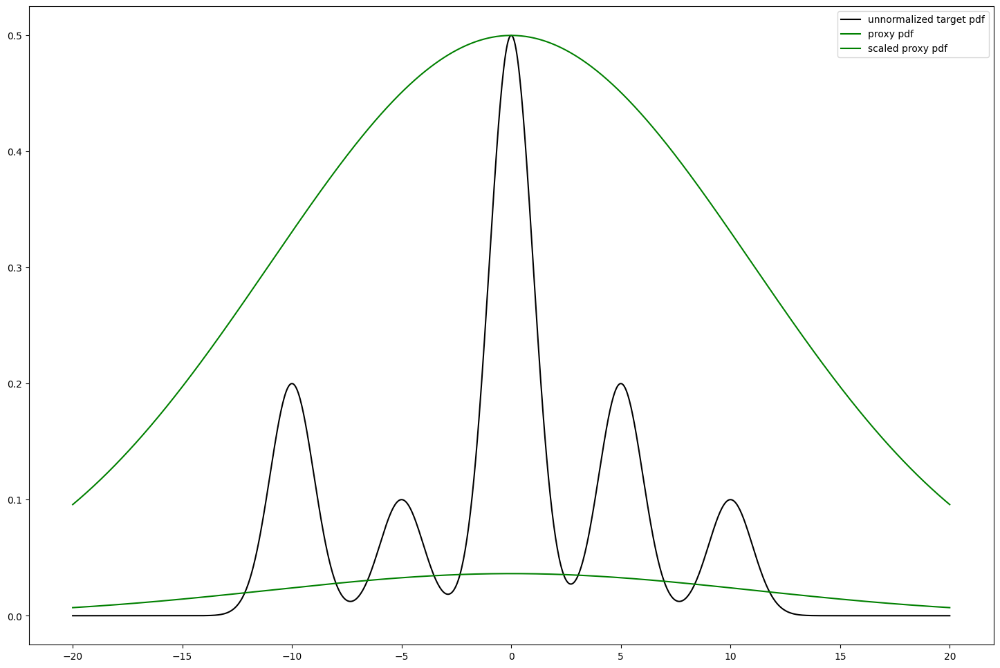

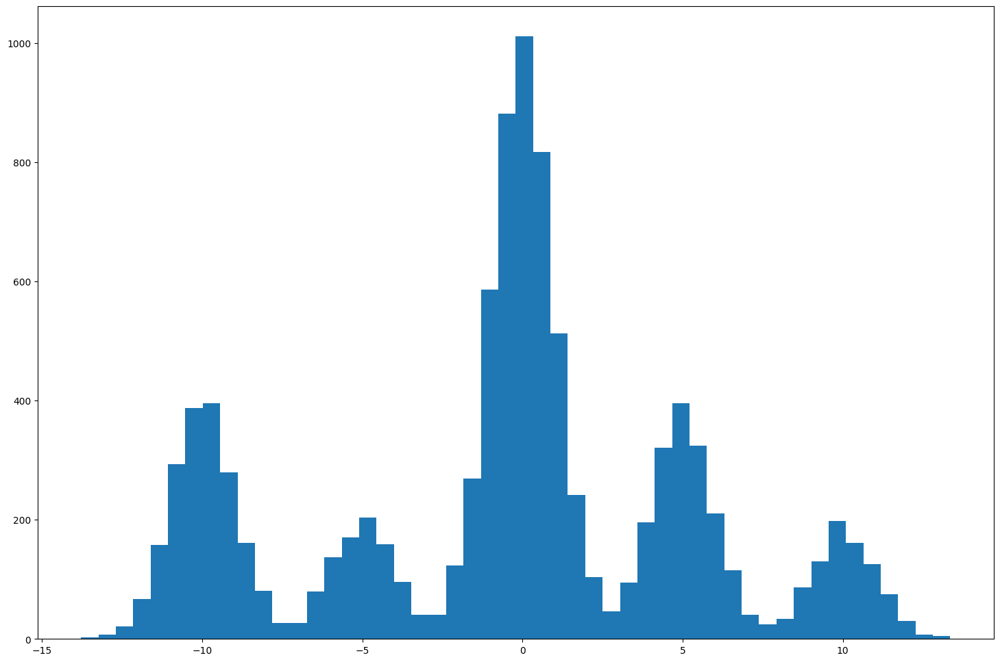

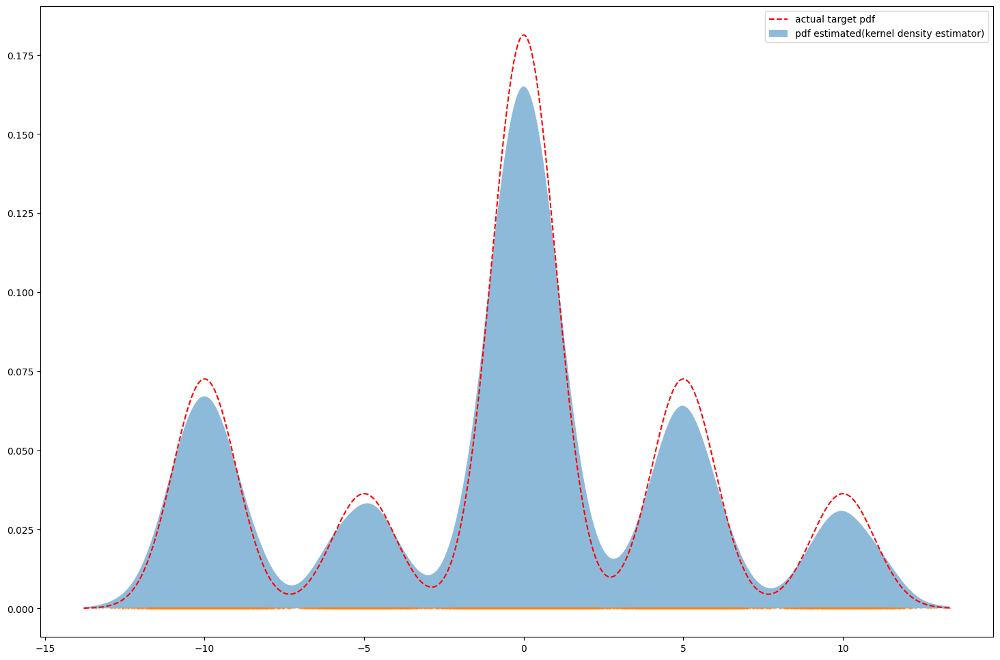

Sampling 100000 points using rejection sampling...


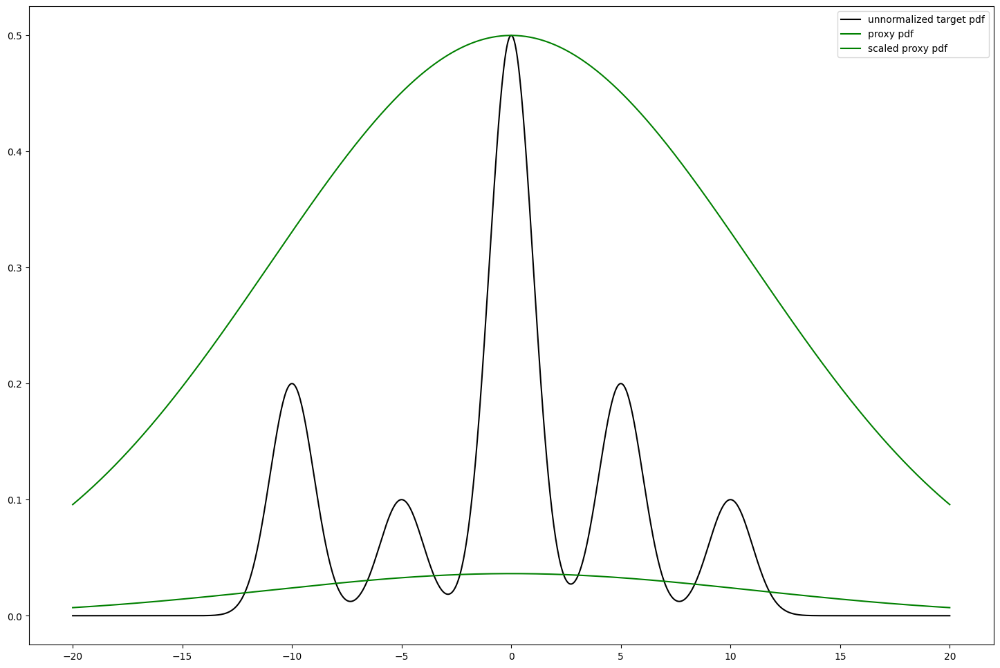

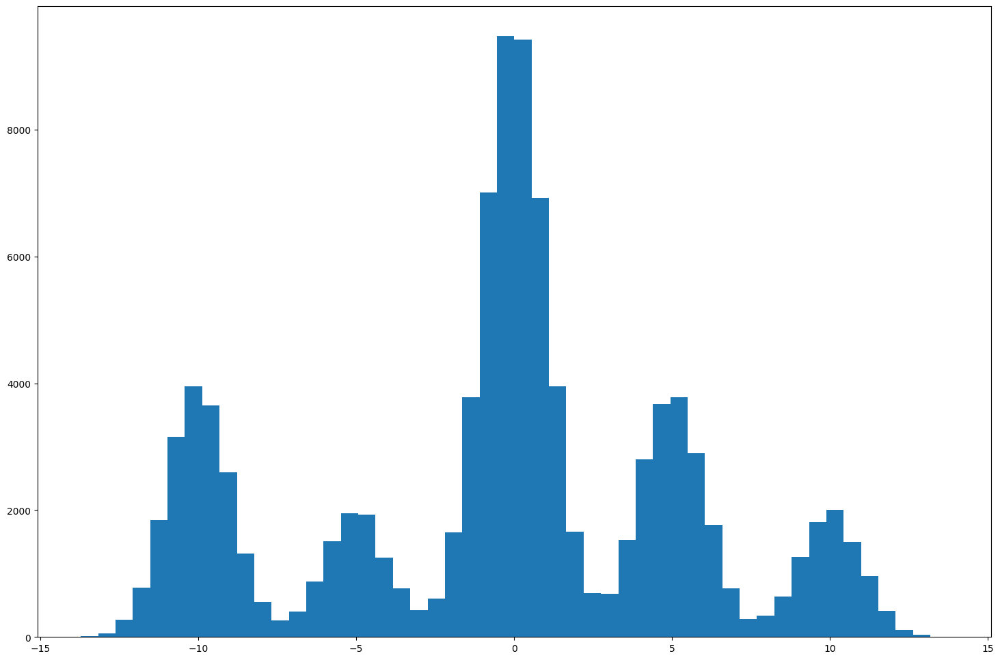

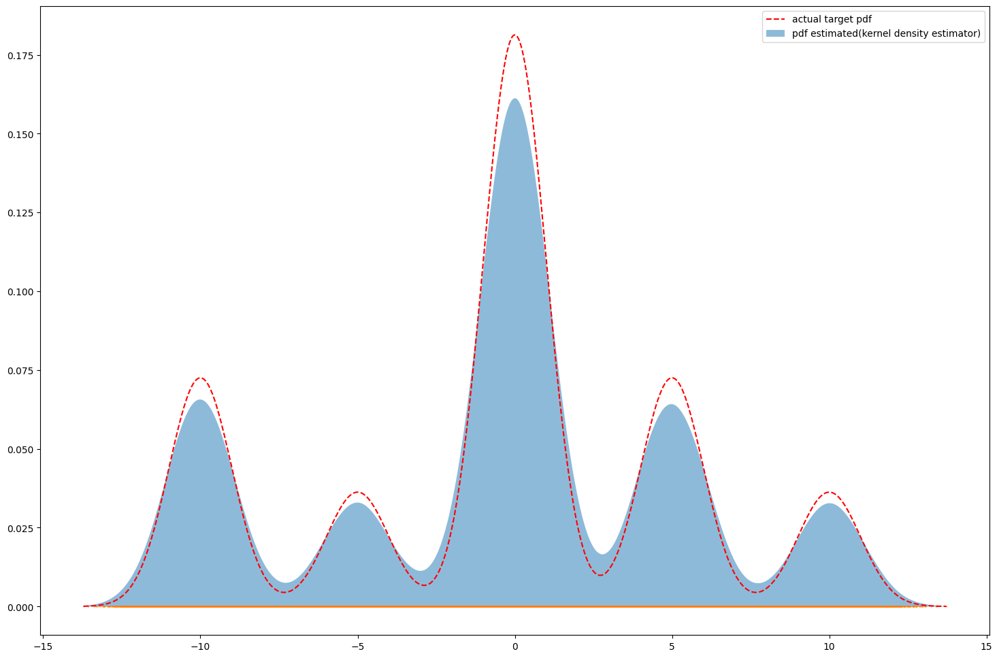

In [288]:
xs = np.linspace(-20,20,1000)
fX_fn = lambda x: 0.1*np.exp(-1/2/(1**2)*((x+5)**2)) + 0.5*np.exp(-1/2/(1**2)*((x)**2)) + 0.2*np.exp(-1/2/(1**2)*((x-5)**2)) + 0.2*np.exp(-1/2/(1**2)*((x+10)**2))+0.1*np.exp(-1/2/(1**2)*((x-10)**2))
# NC_f = (2*pi)**0.5 * (3+3)

g_dist = scipy.stats.norm
gX_fn = lambda x: g_dist.pdf(x,scale=11)
gSamples_fn = lambda N: g_dist.rvs(scale=11,size=N)

for N in [10**i for i in range(1,6)]:
    print(f"Sampling {N} points using rejection sampling...")
    samples = rejection_sampling(fX_fn, gX_fn, gSamples_fn, N_samples=N)

## Importance Sampling

In [291]:
def importance_sampling(expec_fn, fX_fn, gX_fn, gSamples_fn, N_samples=1000, normalized=True):
    '''Generate Samples'''
    y = gSamples_fn(N)
    
    w = fX_fn(y)/gX_fn(y)
    if normalized:
        res = np.mean(expec_fn(y)*w)
    else:
        res = np.sum(expec_fn(y)*w)
        res /= np.sum(w)
    
    return res

In [292]:
xs = np.linspace(-20,20,1000)
fX_fn = lambda x: 0.1*np.exp(-1/2/(1**2)*((x+5)**2)) + 0.5*np.exp(-1/2/(1**2)*((x)**2)) + 0.2*np.exp(-1/2/(1**2)*((x-5)**2)) + 0.2*np.exp(-1/2/(1**2)*((x+10)**2))+0.1*np.exp(-1/2/(1**2)*((x-10)**2))
NC_f, expectation = get_NC_expec(fX_fn)

g_dist = scipy.stats.norm
gX_fn = lambda x: g_dist.pdf(x,scale=11)
gSamples_fn = lambda N: g_dist.rvs(scale=11,size=N)

expec_fn = lambda x: x

Ns = [int(10**val) for val in np.linspace(0,4,10)]

normalized_expected_values = [[],[]]
for N in Ns:
    print(f"Expecation using {N} points using importance sampling on normalized pdf...")
    expected_values_1 = [importance_sampling(expec_fn, lambda x: fX_fn(x)/NC_f, gX_fn, gSamples_fn, N_samples=N, normalized=True) for _ in range(10000)]
    print(expectation, np.mean(expected_values_1), np.std(expected_values_1))
    normalized_expected_values[0].append(np.full(len(expected_values_1), N).tolist())
    normalized_expected_values[1].append(expected_values_1)
normalized_expected_values = np.array(normalized_expected_values)

unnormalized_expected_values = [[],[]]
for N in Ns:
    print(f"Expecation using {N} points using importance sampling on unnormalized pdf...")
    expected_values_2 = [importance_sampling(expec_fn, lambda x: fX_fn(x), gX_fn, gSamples_fn, N_samples=N, normalized=False) for _ in range(10000)]
    print(expectation, np.mean(expected_values_2), np.std(expected_values_2))
    unnormalized_expected_values[0].append(np.full(len(expected_values_2), N).tolist())
    unnormalized_expected_values[1].append(expected_values_2)
unnormalized_expected_values = np.array(unnormalized_expected_values)

Expecation using 1 points using importance sampling on normalized pdf...
-0.4545454545454546 -0.4395985170223601 7.798462367172987
Expecation using 2 points using importance sampling on normalized pdf...
-0.4545454545454546 -0.3822401426576407 5.4633406006939955
Expecation using 7 points using importance sampling on normalized pdf...
-0.4545454545454546 -0.454323763332426 2.8952354880989426
Expecation using 21 points using importance sampling on normalized pdf...
-0.4545454545454546 -0.44012633259898776 1.6900007134696564
Expecation using 59 points using importance sampling on normalized pdf...
-0.4545454545454546 -0.46098067998283704 0.9981302087884042
Expecation using 166 points using importance sampling on normalized pdf...
-0.4545454545454546 -0.45631357674218487 0.5966892463673646
Expecation using 464 points using importance sampling on normalized pdf...
-0.4545454545454546 -0.45532731765099016 0.3568821549828227
Expecation using 1291 points using importance sampling on normalized

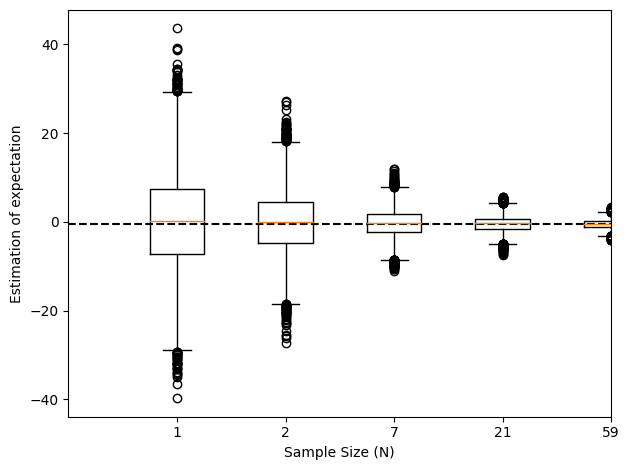

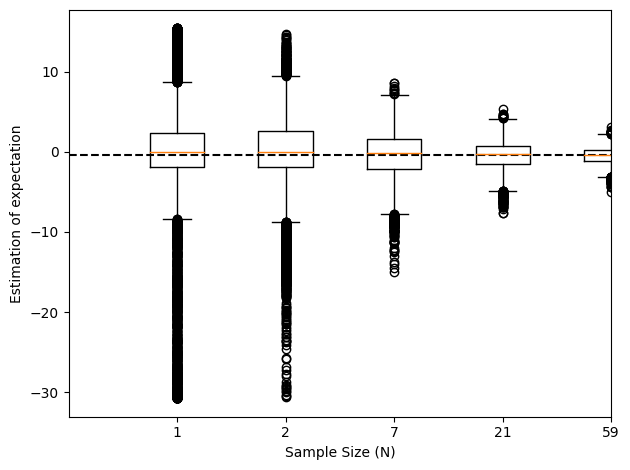

In [293]:
plt.figure()
# plt.subplot(2,1,1)
plt.axhline(y=expectation, color='black', linestyle='--')
# for i in range(unnormalized_expected_values.shape[1]):
#     plt.scatter(np.log10(unnormalized_expected_values[0][i]), unnormalized_expected_values[1][i], s=1, marker='+', c='r')
# plt.xlim(0,max(np.log10(Ns))+1)
# plt.show()
# plt.figure()
plt.boxplot(unnormalized_expected_values[1].T, labels=Ns)
plt.xlabel("Sample Size (N)")
plt.ylabel("Estimation of expectation")
plt.xlim(0,max(np.log10(Ns))+1)
plt.tight_layout()
plt.show()



plt.figure()
# plt.subplot(2,1,1)
plt.axhline(y=expectation, color='black', linestyle='--')
# for i in range(unnormalized_expected_values.shape[1]):
#     plt.scatter(np.log10(unnormalized_expected_values[0][i]), unnormalized_expected_values[1][i], s=1, marker='+', c='r')
# plt.xlim(0,max(np.log10(Ns))+1)
# plt.show()
# plt.figure()
plt.boxplot(normalized_expected_values[1].T, labels=Ns)
plt.xlabel("Sample Size (N)")
plt.ylabel("Estimation of expectation")
plt.xlim(0,max(np.log10(Ns))+1)
plt.tight_layout()
plt.show()

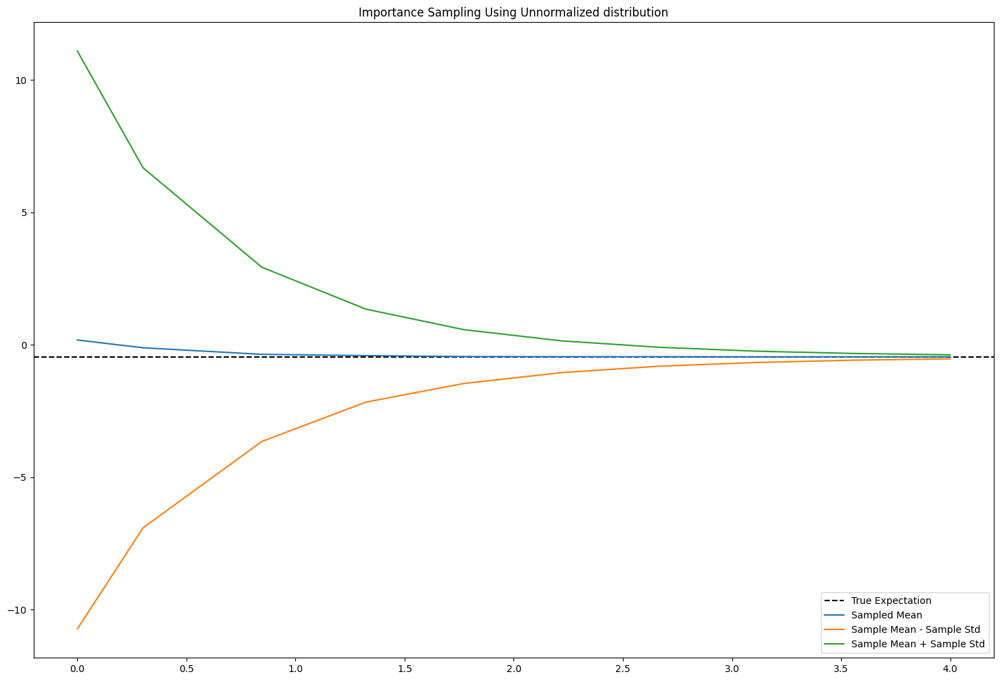

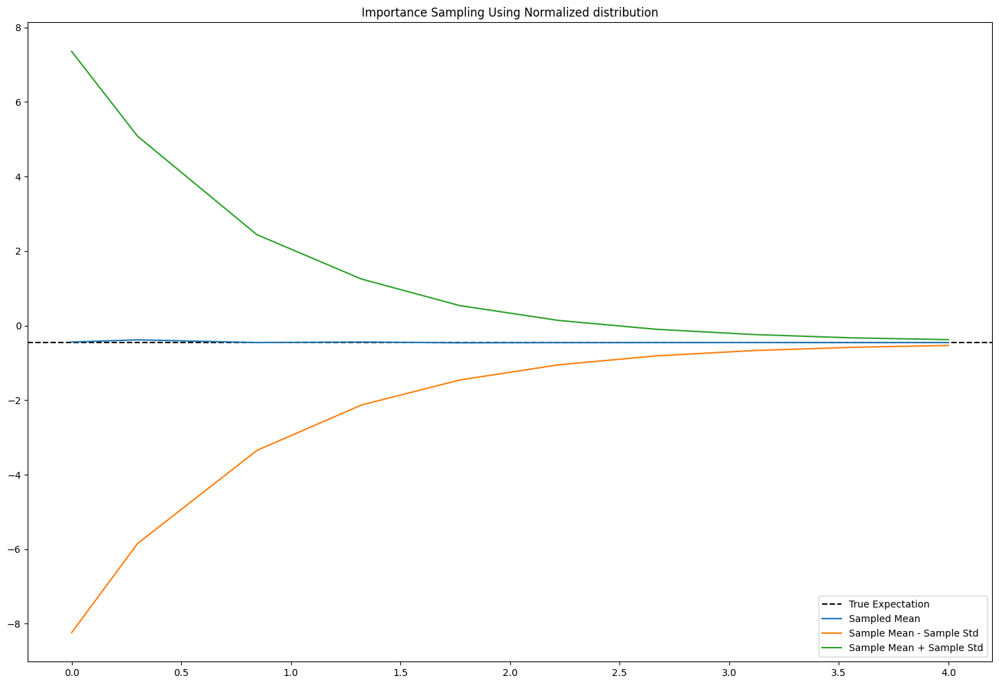

In [295]:
plt.figure(figsize=(18,12))
plt.axhline(y=expectation, color='black', linestyle='--', label='True Expectation')
plt.plot(np.log10(np.mean(unnormalized_expected_values[0], axis=1)), np.mean(unnormalized_expected_values[1], axis=1), label='Sampled Mean')
plt.plot(np.log10(np.mean(unnormalized_expected_values[0], axis=1)), np.mean(unnormalized_expected_values[1], axis=1)-np.std(unnormalized_expected_values[1], axis=1), label='Sample Mean - Sample Std')
plt.plot(np.log10(np.mean(unnormalized_expected_values[0], axis=1)), np.mean(unnormalized_expected_values[1], axis=1)+np.std(unnormalized_expected_values[1], axis=1), label='Sample Mean + Sample Std')
plt.legend(loc='lower right')
plt.title('Importance Sampling Using Unnormalized distribution')
plt.show()

plt.figure(figsize=(18,12))
plt.axhline(y=expectation, color='black', linestyle='--', label='True Expectation')
plt.plot(np.log10(np.mean(normalized_expected_values[0], axis=1)), np.mean(normalized_expected_values[1], axis=1), label='Sampled Mean')
plt.plot(np.log10(np.mean(normalized_expected_values[0], axis=1)), np.mean(normalized_expected_values[1], axis=1)-np.std(normalized_expected_values[1], axis=1), label='Sample Mean - Sample Std')
plt.plot(np.log10(np.mean(normalized_expected_values[0], axis=1)), np.mean(normalized_expected_values[1], axis=1)+np.std(normalized_expected_values[1], axis=1), label='Sample Mean + Sample Std')
plt.legend(loc='lower right')
plt.title('Importance Sampling Using Normalized distribution')
plt.show()



# MCMC 

In [9]:
'''Markov chain with uniform cirlce exploration'''
class UniformCircleMarkovChain:
    def __init__(self,R=0.1):
        self.R = R
        self.p = 1/(pi*R**2)
    def get_proposal(self, x):
        radius = np.sqrt(np.random.uniform(size=1)).item()* self.R
        angle = np.random.uniform(size=1).item()*2*np.pi
        return np.stack([x[0]+radius*np.cos(angle), x[1]+radius*np.sin(angle)], axis=0)
    
    def get_pdf(self,from_x, to_x):
        if np.linalg.norm(from_x-to_x) <= self.R:
            return self.p
        else:
            return 0

def MCC(fX_fn, proposalMC, N=1000):
    '''Randomly start x'''
    x = np.random.randn(2,1)
    samples = [x.flatten()]
    proposals = [[x.flatten()],['green']]
    
    while len(samples) < N:
        # print(x)
        proposal_x = proposalMC.get_proposal(x)
        proposals[0].append(proposal_x.flatten())
        u = np.random.uniform(size=1).item()
#         print(u,proposal_x, x,fX_fn(proposal_x),fX_fn(x))
        if u <= fX_fn(proposal_x)/fX_fn(x) * proposalMC.get_pdf(from_x=proposal_x, to_x=x)/proposalMC.get_pdf(from_x=x, to_x=proposal_x):
            x = proposal_x
            proposals[1].append('green')
        else:
            proposals[1].append('red')
            proposals[0].append(x.flatten())
            proposals[1].append('0.5')
            
        samples.append(x.flatten())
    samples = np.array(samples)
    proposals[0] = np.array(proposals[0])
    proposals[1] = np.array(proposals[1])
    return samples, proposals

[-0.98993251  0.47595109] 0.9746588693957114


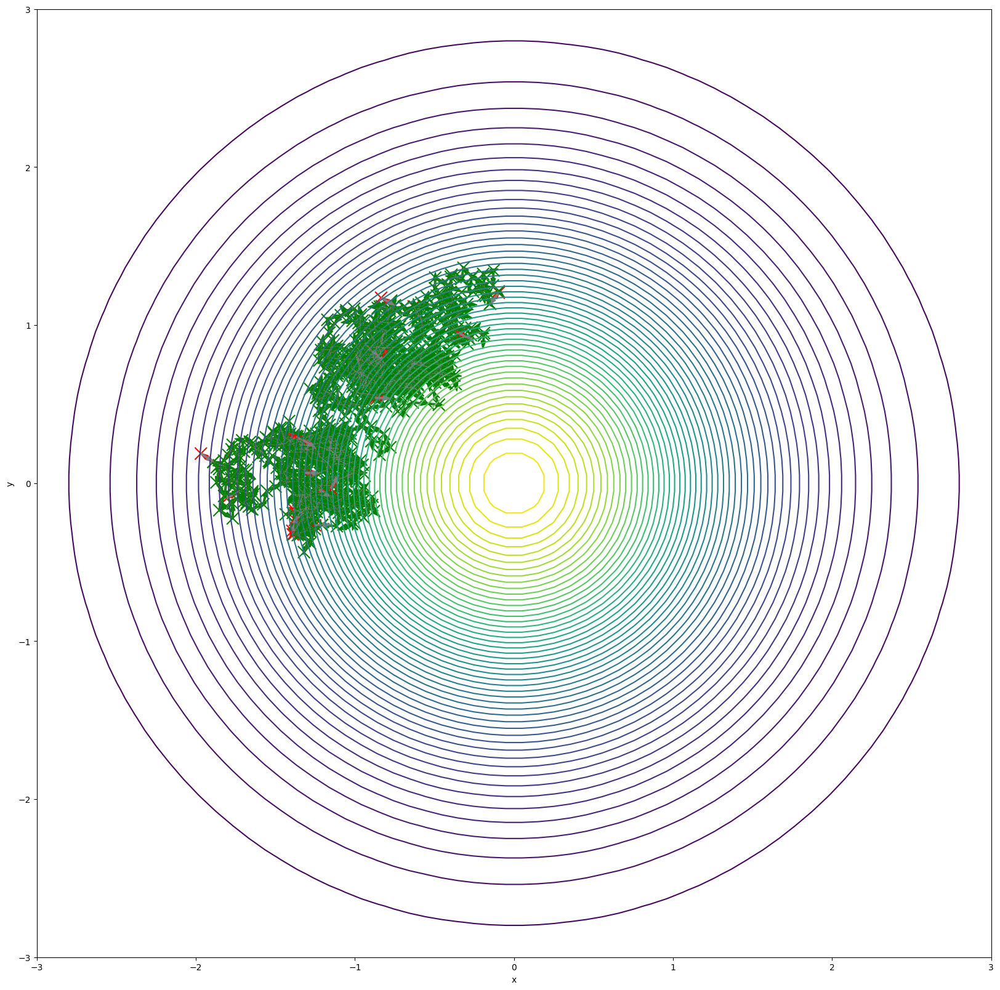

In [298]:
proposalMC = UniformCircleMarkovChain(R=0.1)

sigma = np.eye(2)
mu = np.array([[0],[0]])
fX_fn = lambda x: (np.exp(-1/2*(x-mu).T@ np.linalg.inv(sigma)@ (x-mu))).diagonal() if x.ndim ==2 else (np.exp(-1/2*(x-mu).reshape(1,-1)@ np.linalg.inv(sigma)@ (x-mu).reshape(-1,1))).item()

samples, proposals = MCC(fX_fn, proposalMC, N=1000)


'''Plot the results'''
x = np.linspace(-5,5,100), np.linspace(-5,5,100)
x = np.meshgrid(*x)
x_vecs= np.stack([x[0].flatten(), x[1].flatten()], axis=0)
f_vals = fX_fn(x_vecs).reshape(x[0].shape)

plt.figure(figsize=(20,20))
plt.contour(x[0], x[1], f_vals, levels=50)
plt.xlabel("x")
plt.ylabel("y")
plt.xlim(-3,3)
plt.ylim(-3,3)

'''Plot the path of Markov Chain'''
dxs,dys = np.diff(proposals[0][:,0]), np.diff(proposals[0][:,1])
plt.plot([val[0] for val in proposals[0]],[val[1] for val in proposals[0]], '--',  color='0.5', linewidth=0.5)
plt.scatter([val[0] for val in proposals[0]],[val[1] for val in proposals[0]],color=['green' if val=='0.5' else val for val in proposals[1] ], s=200, marker='x')
for x,y,dx,dy,color in zip(proposals[0][:-1,0], proposals[0][:-1,1], dxs[:],dys[:], proposals[1][1:]):
    dx_,dy_ = dx*0.1/(dx**2+dy**2)**0.5,dy*0.1/(dx**2+dy**2)**0.5
    plt.arrow(x,y,dx_,dy_, width=0.01, head_width=0.03, length_includes_head=True, head_length=0.05, color=color)
# plt.grid(True)
print(np.mean(samples,axis=0), samples.shape[0]/proposals[1].size) 

[ 0.11373375 -0.03090768] 0.8110300081103001


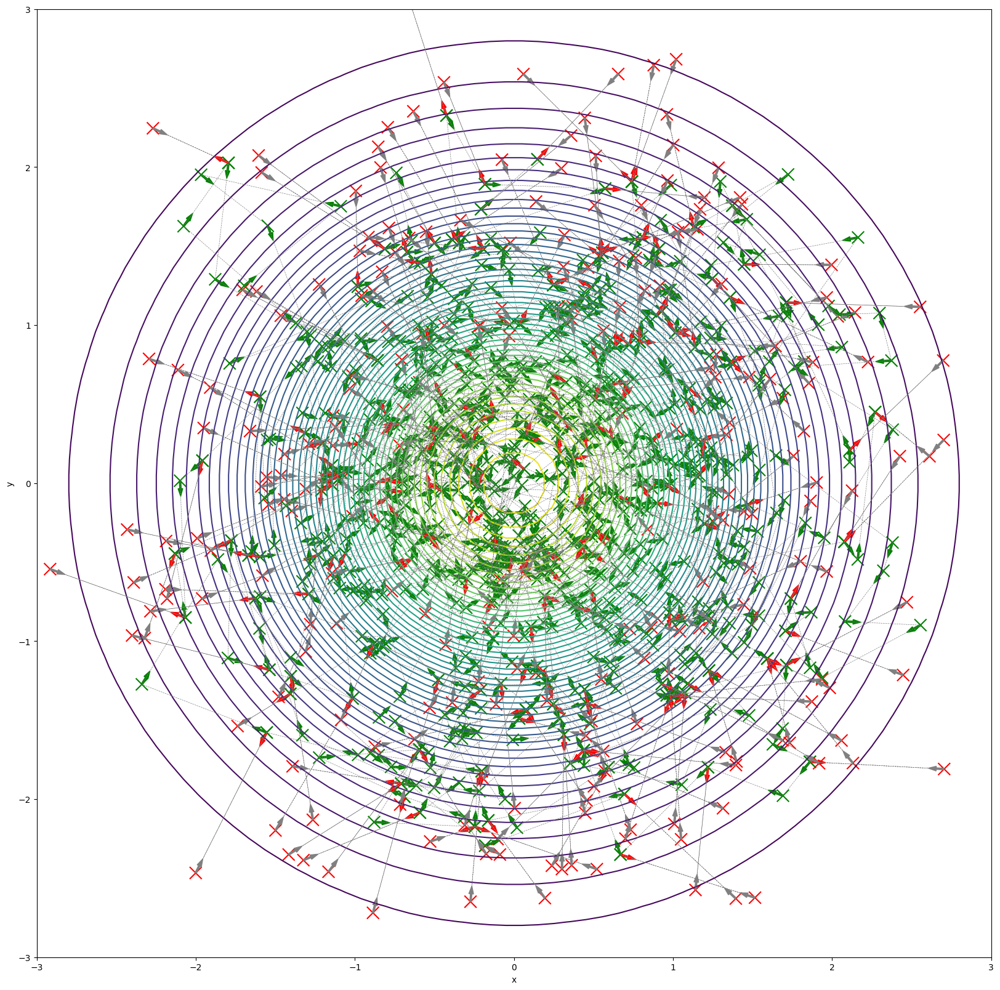

In [53]:
proposalMC = UniformCircleMarkovChain(R=1)

sigma = np.eye(2)
mu = np.array([[0],[0]])
fX_fn = lambda x: (np.exp(-1/2*(x-mu).T@ np.linalg.inv(sigma)@ (x-mu))).diagonal() if x.ndim ==2 else (np.exp(-1/2*(x-mu).reshape(1,-1)@ np.linalg.inv(sigma)@ (x-mu).reshape(-1,1))).item()

samples, proposals = MCC(fX_fn, proposalMC, N=1000)


'''Plot the results'''
x = np.linspace(-5,5,100), np.linspace(-5,5,100)
x = np.meshgrid(*x)
x_vecs= np.stack([x[0].flatten(), x[1].flatten()], axis=0)
f_vals = fX_fn(x_vecs).reshape(x[0].shape)

plt.figure(figsize=(20,20))
plt.contour(x[0], x[1], f_vals, levels=50)
plt.xlabel("x")
plt.ylabel("y")
plt.xlim(-3,3)
plt.ylim(-3,3)

'''Plot the path of Markov Chain'''
dxs,dys = np.diff(proposals[0][:,0]), np.diff(proposals[0][:,1])
plt.plot([val[0] for val in proposals[0]],[val[1] for val in proposals[0]], '--',  color='0.5', linewidth=0.5)
plt.scatter([val[0] for val in proposals[0]],[val[1] for val in proposals[0]],color=['green' if val=='0.5' else val for val in proposals[1] ], s=200, marker='x')
for x,y,dx,dy,color in zip(proposals[0][:-1,0], proposals[0][:-1,1], dxs[:],dys[:], proposals[1][1:]):
    dx_,dy_ = dx*0.1/(dx**2+dy**2)**0.5,dy*0.1/(dx**2+dy**2)**0.5
    plt.arrow(x,y,dx_,dy_, width=0.01, head_width=0.03, length_includes_head=True, head_length=0.05, color=color)
# plt.grid(True)
print(np.mean(samples,axis=0), samples.shape[0]/proposals[1].size) 

### Skewed Distribution

/var/folders/m8/p1693_l938l9s_6f9h2nhnxh0000gn/T/ipykernel_26916/592174026.py:5: RuntimeWarning: overflow encountered in exp
  fX_fn = lambda x: (np.exp(-1/2*(x-mu).T@ np.linalg.inv(sigma)@ (x-mu))).diagonal() if x.ndim ==2 else (np.exp(-1/2*(x-mu).reshape(1,-1)@ np.linalg.inv(sigma)@ (x-mu).reshape(-1,1))).item()


[-1.23800809 -1.35324577] 0.8481764206955047


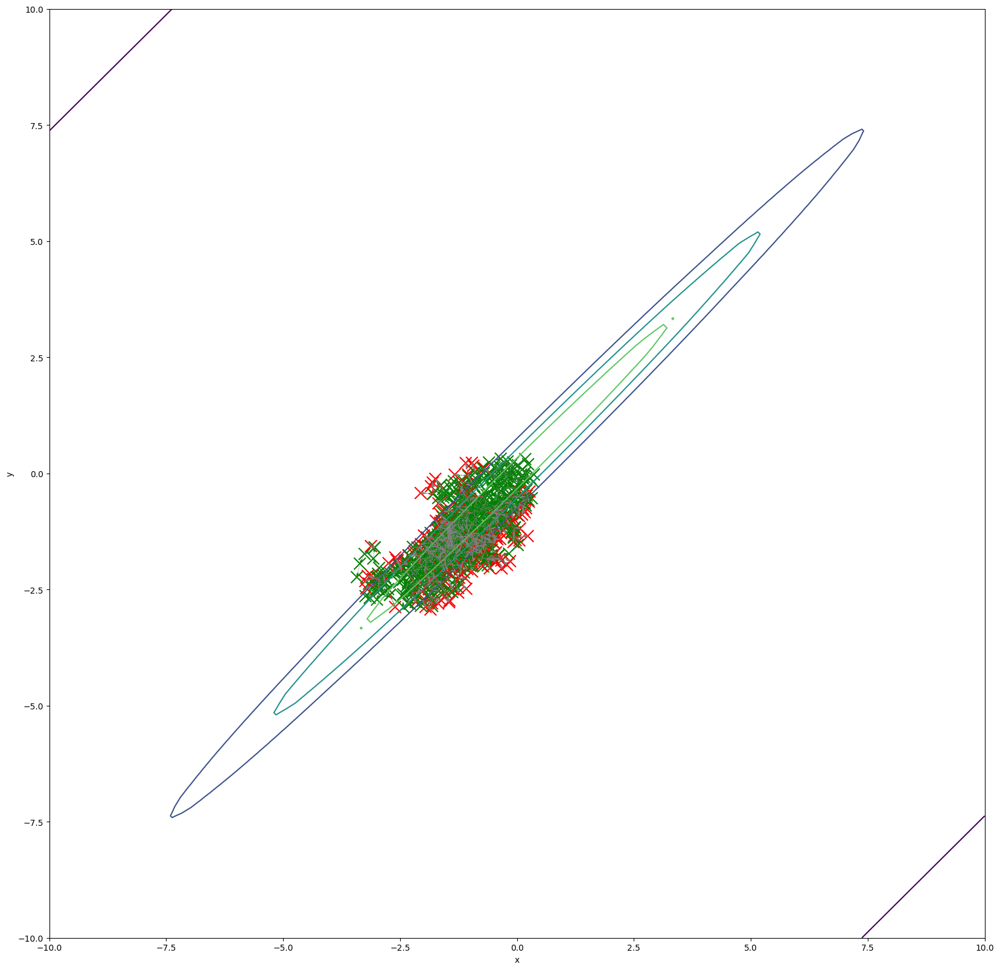

In [160]:
proposalMC = UniformCircleMarkovChain(R=0.3)

sigma = np.array([[20,19.9],[19.9,20]])
mu = np.array([[0],[0]])
fX_fn = lambda x: (np.exp(-1/2*(x-mu).T@ np.linalg.inv(sigma)@ (x-mu))).diagonal() if x.ndim ==2 else (np.exp(-1/2*(x-mu).reshape(1,-1)@ np.linalg.inv(sigma)@ (x-mu).reshape(-1,1))).item()

samples, proposals = MCC(fX_fn, proposalMC, N=1000)


'''Plot the results'''
x = np.linspace(-10,10,100), np.linspace(-10,10,100)
x = np.meshgrid(*x)
x_vecs= np.stack([x[0].flatten(), x[1].flatten()], axis=0)
f_vals = fX_fn(x_vecs).reshape(x[0].shape)

plt.figure(figsize=(20,20))
plt.contour(x[0], x[1], f_vals, levels=3)
plt.xlabel("x")
plt.ylabel("y")
plt.xlim(-10,10)
plt.ylim(-10,10)

'''Plot the path of Markov Chain'''
dxs,dys = np.diff(proposals[0][:,0]), np.diff(proposals[0][:,1])
plt.plot([val[0] for val in proposals[0]],[val[1] for val in proposals[0]], '--',  color='0.5', linewidth=0.5)
plt.scatter([val[0] for val in proposals[0]],[val[1] for val in proposals[0]],color=['green' if val=='0.5' else val for val in proposals[1] ], s=200, marker='x')
for x,y,dx,dy,color in zip(proposals[0][:-1,0], proposals[0][:-1,1], dxs[:],dys[:], proposals[1][1:]):
    dx_,dy_ = dx*0.1/(dx**2+dy**2)**0.5,dy*0.1/(dx**2+dy**2)**0.5
    plt.arrow(x,y,dx_,dy_, width=0.01, head_width=0.03, length_includes_head=True, head_length=0.05, color=color)
# plt.grid(True)
# plt.autoscale()

print(np.mean(samples,axis=0), samples.shape[0]/proposals[1].size) 

/var/folders/m8/p1693_l938l9s_6f9h2nhnxh0000gn/T/ipykernel_26916/305343573.py:5: RuntimeWarning: overflow encountered in exp
  fX_fn = lambda x: (np.exp(-1/2*(x-mu).T@ np.linalg.inv(sigma)@ (x-mu))).diagonal() if x.ndim ==2 else (np.exp(-1/2*(x-mu).reshape(1,-1)@ np.linalg.inv(sigma)@ (x-mu).reshape(-1,1))).item()
 65%|████████████████████████████▌               | 13/20 [49:56<26:53, 230.53s/it]


[4.7634141  4.72055015] 0.7457121551081283


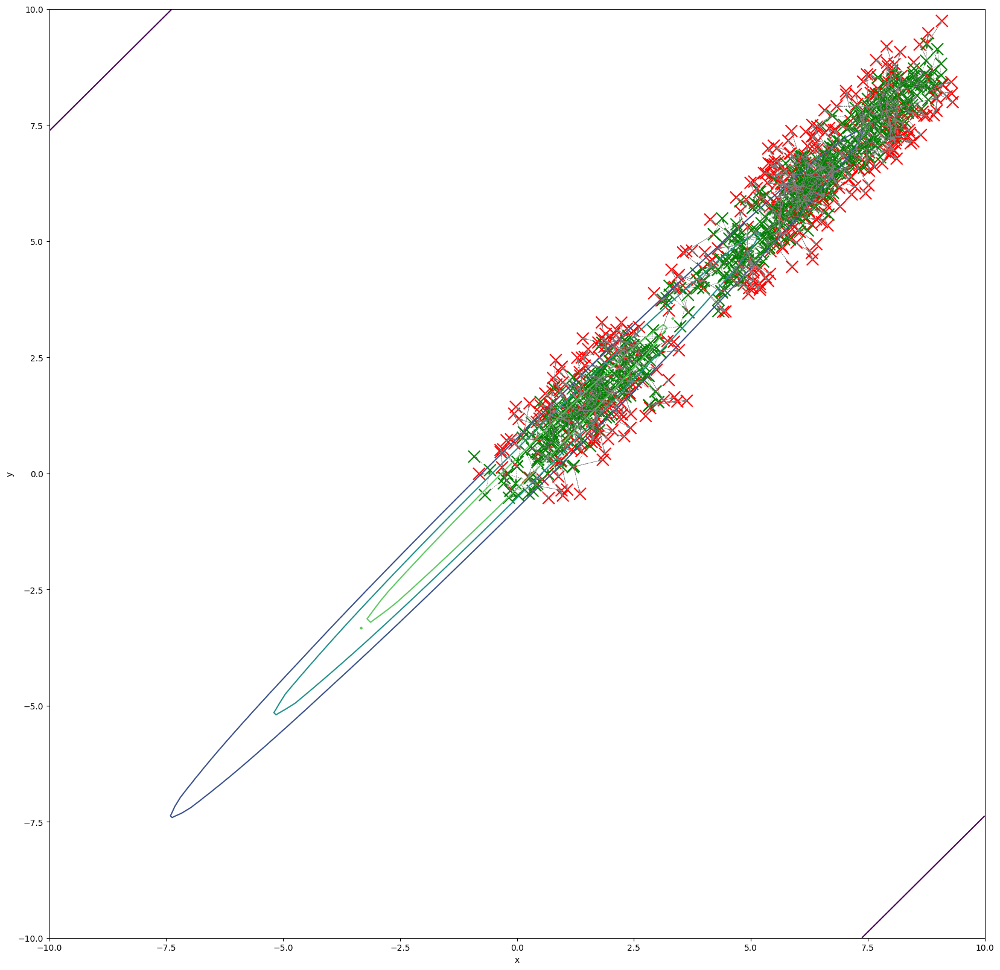

In [161]:
proposalMC = UniformCircleMarkovChain(R=0.7)

sigma = np.array([[20,19.9],[19.9,20]])
mu = np.array([[0],[0]])
fX_fn = lambda x: (np.exp(-1/2*(x-mu).T@ np.linalg.inv(sigma)@ (x-mu))).diagonal() if x.ndim ==2 else (np.exp(-1/2*(x-mu).reshape(1,-1)@ np.linalg.inv(sigma)@ (x-mu).reshape(-1,1))).item()

samples, proposals = MCC(fX_fn, proposalMC, N=1000)


'''Plot the results'''
x = np.linspace(-10,10,100), np.linspace(-10,10,100)
x = np.meshgrid(*x)
x_vecs= np.stack([x[0].flatten(), x[1].flatten()], axis=0)
f_vals = fX_fn(x_vecs).reshape(x[0].shape)

plt.figure(figsize=(20,20))
plt.contour(x[0], x[1], f_vals, levels=3)
plt.xlabel("x")
plt.ylabel("y")
plt.xlim(-10,10)
plt.ylim(-10,10)

'''Plot the path of Markov Chain'''
dxs,dys = np.diff(proposals[0][:,0]), np.diff(proposals[0][:,1])
plt.plot([val[0] for val in proposals[0]],[val[1] for val in proposals[0]], '--',  color='0.5', linewidth=0.5)
plt.scatter([val[0] for val in proposals[0]],[val[1] for val in proposals[0]],color=['green' if val=='0.5' else val for val in proposals[1] ], s=200, marker='x')
for x,y,dx,dy,color in zip(proposals[0][:-1,0], proposals[0][:-1,1], dxs[:],dys[:], proposals[1][1:]):
    dx_,dy_ = dx*0.1/(dx**2+dy**2)**0.5,dy*0.1/(dx**2+dy**2)**0.5
    plt.arrow(x,y,dx_,dy_, width=0.01, head_width=0.03, length_includes_head=True, head_length=0.05, color=color)
# plt.grid(True)
# plt.autoscale()
print(np.mean(samples,axis=0), samples.shape[0]/proposals[1].size) 

## Gibbs Sampling

In [12]:
'''Markov chain with uniform circle exploration'''
class GibbsEachDimensionUniformSampler:
    def __init__(self,R=0.1):
        self.R = R
        self.p = 1/self.R
        self.idx=1
    def get_proposal(self, x):
        self.idx = (self.idx+1)%x.ndim
        val = np.random.uniform(-self.R/2,self.R/2,size=1).item()
        new_val = x.copy()
        new_val[self.idx] += val
        return new_val
    
    def get_pdf(self,from_x, to_x):
        if np.linalg.norm(from_x-to_x) <= self.R/2:
            return self.p
        else:
            return 0

[0.61849301 0.05359882] 0.9082652134423251


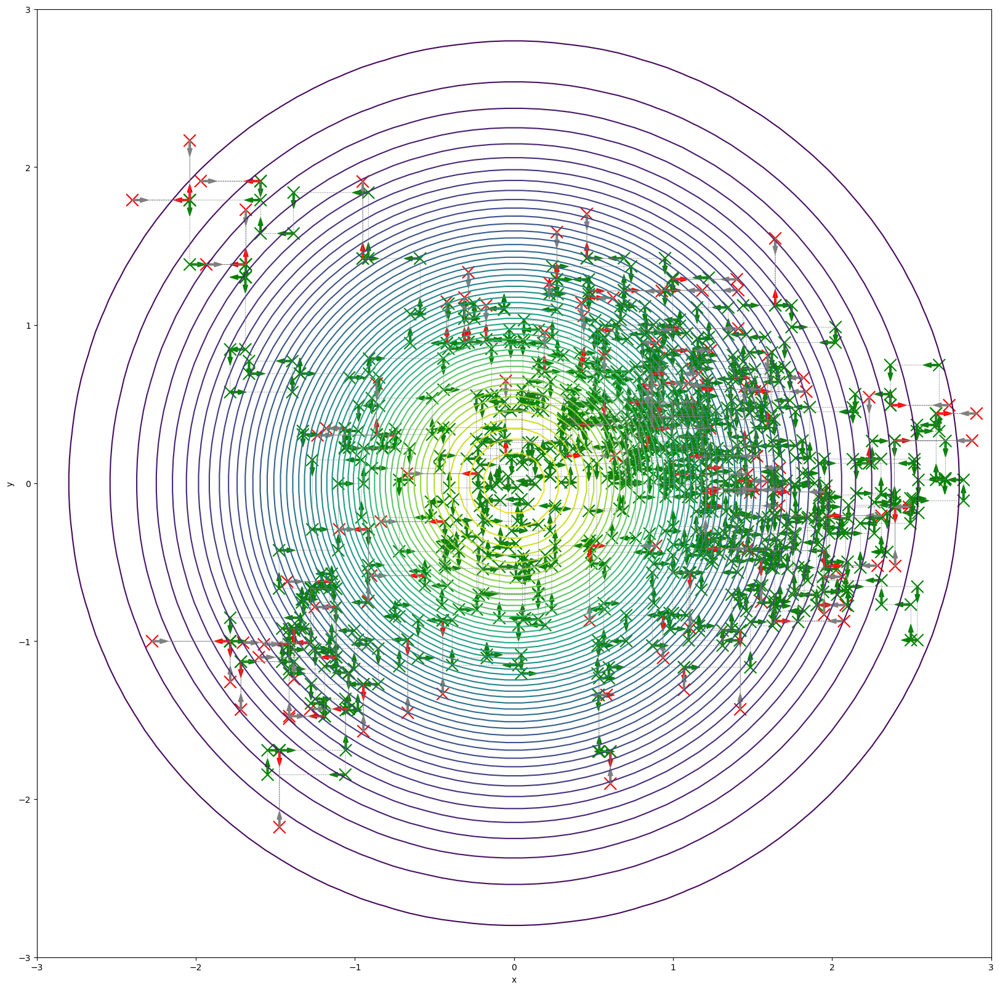

In [99]:
proposalMC = GibbsEachDimensionUniformSampler(R=1)

sigma = np.eye(2)
mu = np.array([[0],[0]])
fX_fn = lambda x: (np.exp(-1/2*(x-mu).T@ np.linalg.inv(sigma)@ (x-mu))).diagonal() if x.ndim ==2 else (np.exp(-1/2*(x-mu).reshape(1,-1)@ np.linalg.inv(sigma)@ (x-mu).reshape(-1,1))).item()

samples, proposals = MCC(fX_fn, proposalMC, N=1000)


'''Plot the results'''
x = np.linspace(-5,5,100), np.linspace(-5,5,100)
x = np.meshgrid(*x)
x_vecs= np.stack([x[0].flatten(), x[1].flatten()], axis=0)
f_vals = fX_fn(x_vecs).reshape(x[0].shape)

plt.figure(figsize=(20,20))
plt.contour(x[0], x[1], f_vals, levels=50)
plt.xlabel("x")
plt.ylabel("y")
plt.xlim(-3,3)
plt.ylim(-3,3)

'''Plot the path of Markov Chain'''
dxs,dys = np.diff(proposals[0][:,0]), np.diff(proposals[0][:,1])
plt.plot([val[0] for val in proposals[0]],[val[1] for val in proposals[0]], '--',  color='0.5', linewidth=0.5)
plt.scatter([val[0] for val in proposals[0]],[val[1] for val in proposals[0]],color=['green' if val=='0.5' else val for val in proposals[1] ], s=200, marker='x')
for x,y,dx,dy,color in zip(proposals[0][:-1,0], proposals[0][:-1,1], dxs[:],dys[:], proposals[1][1:]):
    dx_,dy_ = dx*0.1/(dx**2+dy**2)**0.5,dy*0.1/(dx**2+dy**2)**0.5
    plt.arrow(x,y,dx_,dy_, width=0.01, head_width=0.03, length_includes_head=True, head_length=0.05, color=color)
# plt.grid(True)
print(np.mean(samples,axis=0), samples.shape[0]/proposals[1].size) 

/var/folders/m8/p1693_l938l9s_6f9h2nhnxh0000gn/T/ipykernel_26916/2666202624.py:5: RuntimeWarning: overflow encountered in exp
  fX_fn = lambda x: (np.exp(-1/2*(x-mu).T@ np.linalg.inv(sigma)@ (x-mu))).diagonal() if x.ndim ==2 else (np.exp(-1/2*(x-mu).reshape(1,-1)@ np.linalg.inv(sigma)@ (x-mu).reshape(-1,1))).item()


[1.38230183 1.51441936] 0.8285004142502072


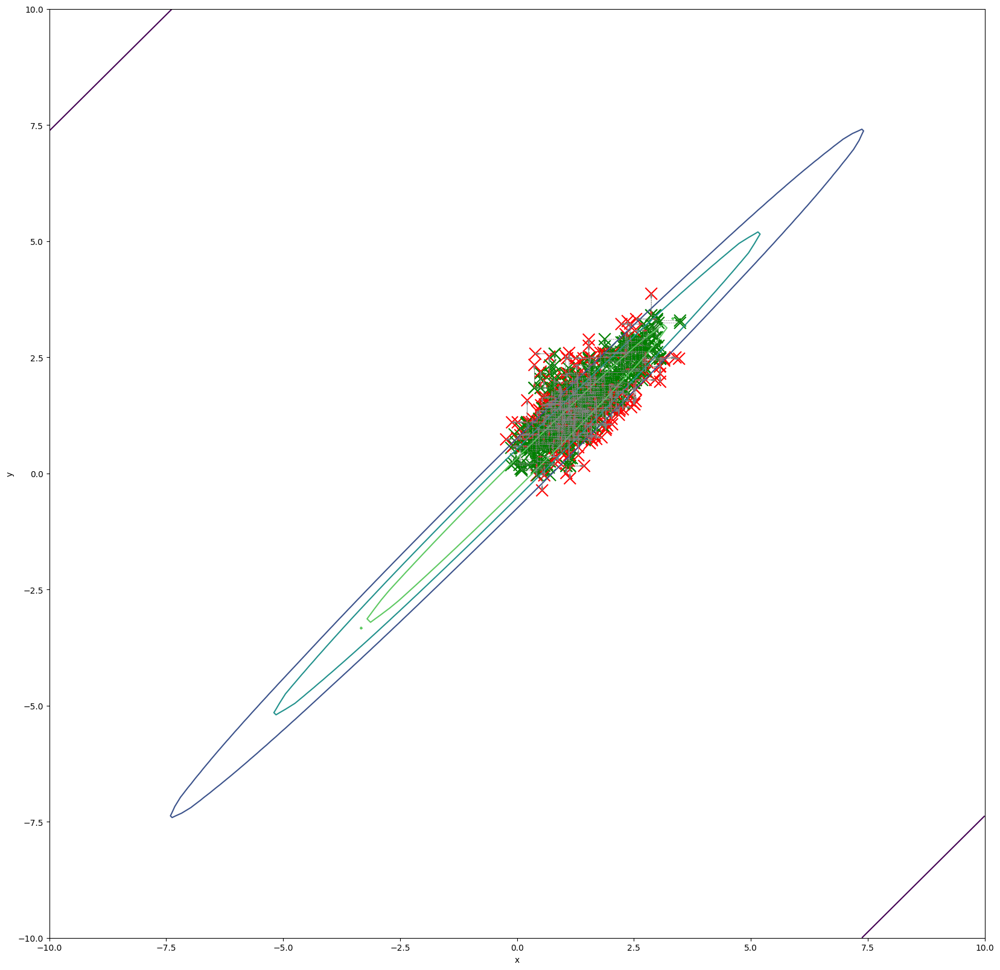

In [101]:
proposalMC = GibbsEachDimensionUniformSampler(R=1)

sigma = np.array([[20,19.9],[19.9,20]])
mu = np.array([[0],[0]])
fX_fn = lambda x: (np.exp(-1/2*(x-mu).T@ np.linalg.inv(sigma)@ (x-mu))).diagonal() if x.ndim ==2 else (np.exp(-1/2*(x-mu).reshape(1,-1)@ np.linalg.inv(sigma)@ (x-mu).reshape(-1,1))).item()

samples, proposals = MCC(fX_fn, proposalMC, N=1000)


'''Plot the results'''
x = np.linspace(-10,10,100), np.linspace(-10,10,100)
x = np.meshgrid(*x)
x_vecs= np.stack([x[0].flatten(), x[1].flatten()], axis=0)
f_vals = fX_fn(x_vecs).reshape(x[0].shape)

plt.figure(figsize=(20,20))
plt.contour(x[0], x[1], f_vals, levels=3)
plt.xlabel("x")
plt.ylabel("y")
plt.xlim(-10,10)
plt.ylim(-10,10)

'''Plot the path of Markov Chain'''
dxs,dys = np.diff(proposals[0][:,0]), np.diff(proposals[0][:,1])
plt.plot([val[0] for val in proposals[0]],[val[1] for val in proposals[0]], '--',  color='0.5', linewidth=0.5)
plt.scatter([val[0] for val in proposals[0]],[val[1] for val in proposals[0]],color=['green' if val=='0.5' else val for val in proposals[1] ], s=200, marker='x')
for x,y,dx,dy,color in zip(proposals[0][:-1,0], proposals[0][:-1,1], dxs[:],dys[:], proposals[1][1:]):
    dx_,dy_ = dx*0.1/(dx**2+dy**2)**0.5,dy*0.1/(dx**2+dy**2)**0.5
    plt.arrow(x,y,dx_,dy_, width=0.01, head_width=0.03, length_includes_head=True, head_length=0.05, color=color)
# plt.grid(True)
# plt.autoscale()
print(np.mean(samples,axis=0), samples.shape[0]/proposals[1].size) 

## Hamiltonian Markov Chain

In [6]:
class HMC:
    def __init__(self, N_step=100, Epsilon_step=0.01, covariance_fn = None, M=None , x_dim=2):
        self.N_step = N_step
        self.Epsilon = Epsilon_step
        self.M= torch.tensor(M) if M is not None else torch.eye(x_dim, requires_grad=False) # mass matrix to be used in normal HMC
        self.covariance_fn = lambda x: self.M if covariance_fn is None else covariance_fn(x) # position dependent covariance for Riemannian HMC
        self.x_dim = x_dim
    
    def sample_momentum(self, x, N=1):
        with torch.no_grad():
            mvn = torch.distributions.multivariate_normal.MultivariateNormal(torch.zeros(self.x_dim, requires_grad=False), self.covariance_fn(x))
            momentum = mvn.sample((N,)).reshape(x.shape)
        return momentum.detach()
    
    def get_momentum_pdf(self, p, x):
        with torch.no_grad():
            mvn = torch.distributions.multivariate_normal.MultivariateNormal(torch.zeros(self.x_dim, requires_grad=False), self.covariance_fn(x))
            return torch.exp(mvn.log_prob(p.squeeze())).detach().item()
            
    def get_state_grad(self,x, p, fx_fn):
        
        x=x.detach()
        p=p.detach()
        x.requires_grad = True
        p.requires_grad = True
        
        
        '''Zero grad and compute the gradients'''
        if x.grad is not None:
            x.grad.zero_()
        if p.grad is not None:
            p.grad.zero_()
        
        H,_,_ = self.compute_energies(x,p,fx_fn)
        H.backward()
        
        dp_dt = - x.grad
        dx_dt = p.grad
        return dx_dt, dp_dt
    
    def run_leapfrog(self, x,p, fx_fn):
        x = x.clone()
        p = p.clone()
        for step in range(self.N_step):
            _, dp_dt = self.get_state_grad(x,p, fx_fn)
            p += self.Epsilon/2 * dp_dt

            x += self.Epsilon * torch.linalg.inv(self.covariance_fn(x))@p

            _, dp_dt = self.get_state_grad(x,p, fx_fn)
            p += self.Epsilon/2 * dp_dt
        return x,p
    
    def run_euler(self, x,p, fx_fn):
        x = x.clone()
        p = p.clone()
        for step in range(self.N_step):
            dx_dt, dp_dt = self.get_state_grad(x,p, fx_fn)
            p += self.Epsilon * dp_dt
            x += self.Epsilon * dx_dt

        return x,p
  
    
    def compute_energies(self, x, p, fx_fn):
        '''Compute Kinetic Energy and Potential Energy'''
        M = self.covariance_fn(x)
        U = -torch.log(fx_fn(x))
        K = (1/2 * p.T @ torch.linalg.inv(M) @ p + 1/2 * torch.log(torch.linalg.det(M)))
        # print((U+K).item(), U.item(),K.item())
        return U+K, U, K

    def __call__(self,fx_fn, N=100, solver='leapfrog') :
        x = torch.randn(size=(self.x_dim,1))
        fx_fn(x)

        samples = [x.numpy().flatten()]
        proposals = [[x.numpy().flatten()],['green']]
        
        while len(samples) < N:
            # print("\n\n\n")
            p = self.sample_momentum(x)
            '''Compute Kinetic Energy and Potential Energy'''
            H, U, K = self.compute_energies(x, p, fx_fn)
            
            if solver == 'euler':
                x_, p_ = self.run_euler(x, p, fx_fn)
            elif solver == 'leapfrog':
                x_, p_ = self.run_leapfrog(x, p, fx_fn)
                
            H_, U_, K_ = self.compute_energies(x_, p_, fx_fn)
            # print((H_-H).item(),(U_-U).item(),(K_-K).item())
            
            proposals[0].append(x_.numpy().flatten())
            u = np.random.uniform(size=1).item()
            # print(u,fx_fn(x_)/fx_fn(x) * self.get_momentum_pdf(p_,x_)/self.get_momentum_pdf(p,x), fx_fn(x_)/fx_fn(x), self.get_momentum_pdf(p_,x_)/self.get_momentum_pdf(p,x))
            if u <= fx_fn(x_)/fx_fn(x) * self.get_momentum_pdf(p_,x_)/self.get_momentum_pdf(p,x):
                x,p = x_, p_
                proposals[1].append('green')
            else:
                proposals[1].append('red')
                proposals[0].append(x.numpy().flatten())
                proposals[1].append('0.5')

            samples.append(x.numpy().flatten())
        samples = np.array(samples)
        proposals[0] = np.array(proposals[0])
        proposals[1] = np.array(proposals[1])
        return samples, proposals

[-0.0368902  -0.03965905] 1.0


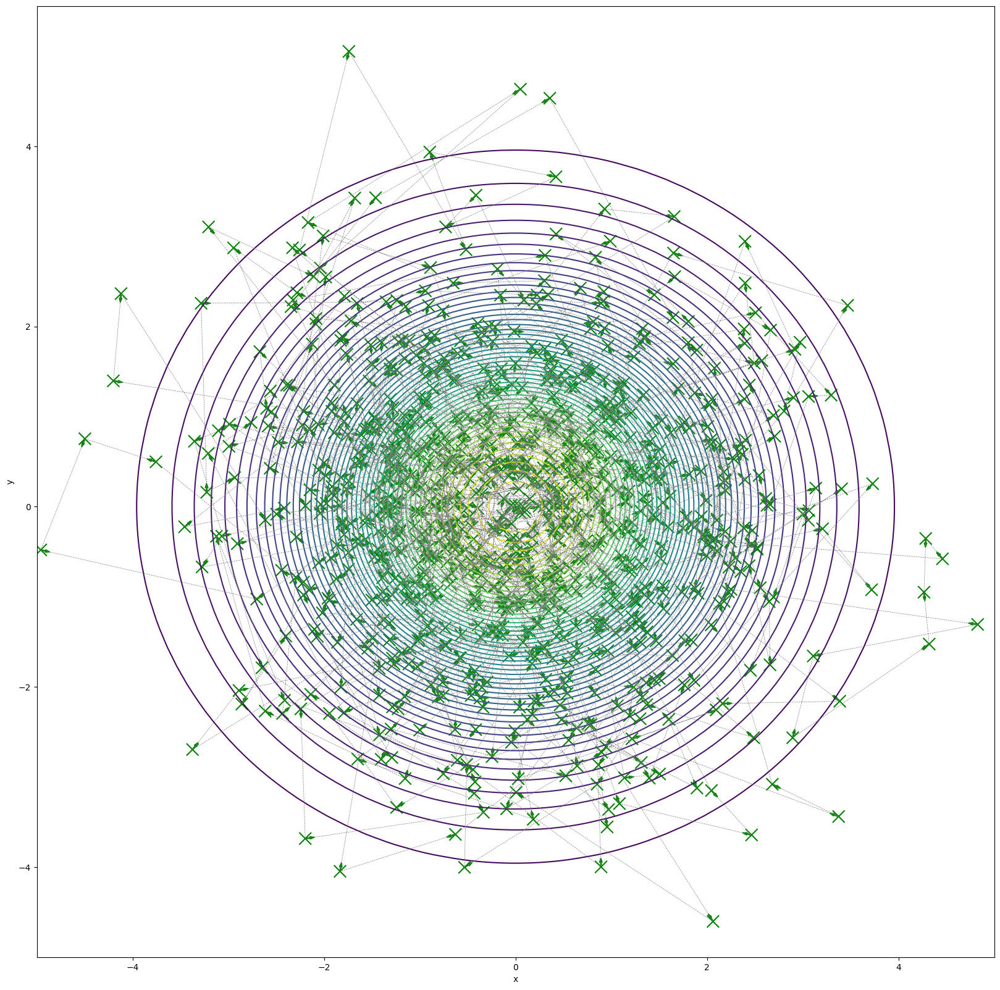

In [299]:
sigma = torch.tensor([[2.,0.],[0.,2.]])
mu = torch.tensor([[0.],[0.]])
fX_fn = lambda x: (torch.exp(-1/2*(x-mu).T@ torch.linalg.inv(sigma)@ (x-mu))).diagonal() if x.ndim ==2 else (torch.exp(-1/2*(x-mu).reshape(1,-1)@ torch.linalg.inv(sigma)@ (x-mu).reshape(-1,1))).item()

sampler = HMC(x_dim=2, Epsilon_step=0.1,N_step=100)
samples, proposals = sampler(fX_fn, N=1000, solver='leapfrog')

'''Plot the results'''
x = np.linspace(-5,5,100), np.linspace(-5,5,100)
x = np.meshgrid(*x)
x_vecs= torch.tensor(np.stack([x[0].flatten(), x[1].flatten()], axis=0)).float()
f_vals = fX_fn(x_vecs).numpy().reshape(x[0].shape)

plt.figure(figsize=(20,20))
plt.contour(x[0], x[1], f_vals, levels=50)
plt.xlabel("x")
plt.ylabel("y")
plt.xlim(-3,3)
plt.ylim(-3,3)

'''Plot the path of Markov Chain'''
dxs,dys = np.diff(proposals[0][:,0]), np.diff(proposals[0][:,1])
plt.plot([val[0] for val in proposals[0]],[val[1] for val in proposals[0]], '--',  color='0.5', linewidth=0.5)
plt.scatter([val[0] for val in proposals[0]],[val[1] for val in proposals[0]],color=['green' if val=='0.5' else val for val in proposals[1] ], s=200, marker='x')
for x,y,dx,dy,color in zip(proposals[0][:-1,0], proposals[0][:-1,1], dxs[:],dys[:], proposals[1][1:]):
    dx_,dy_ = dx*0.1/(dx**2+dy**2)**0.5,dy*0.1/(dx**2+dy**2)**0.5
    plt.arrow(x,y,dx_,dy_, width=0.01, head_width=0.03, length_includes_head=True, head_length=0.05, color=color)
# plt.grid(True)
plt.autoscale()

print(np.mean(samples,axis=0), samples.shape[0]/proposals[1].size) 

[0.102435  0.1027701] 0.999000999000999


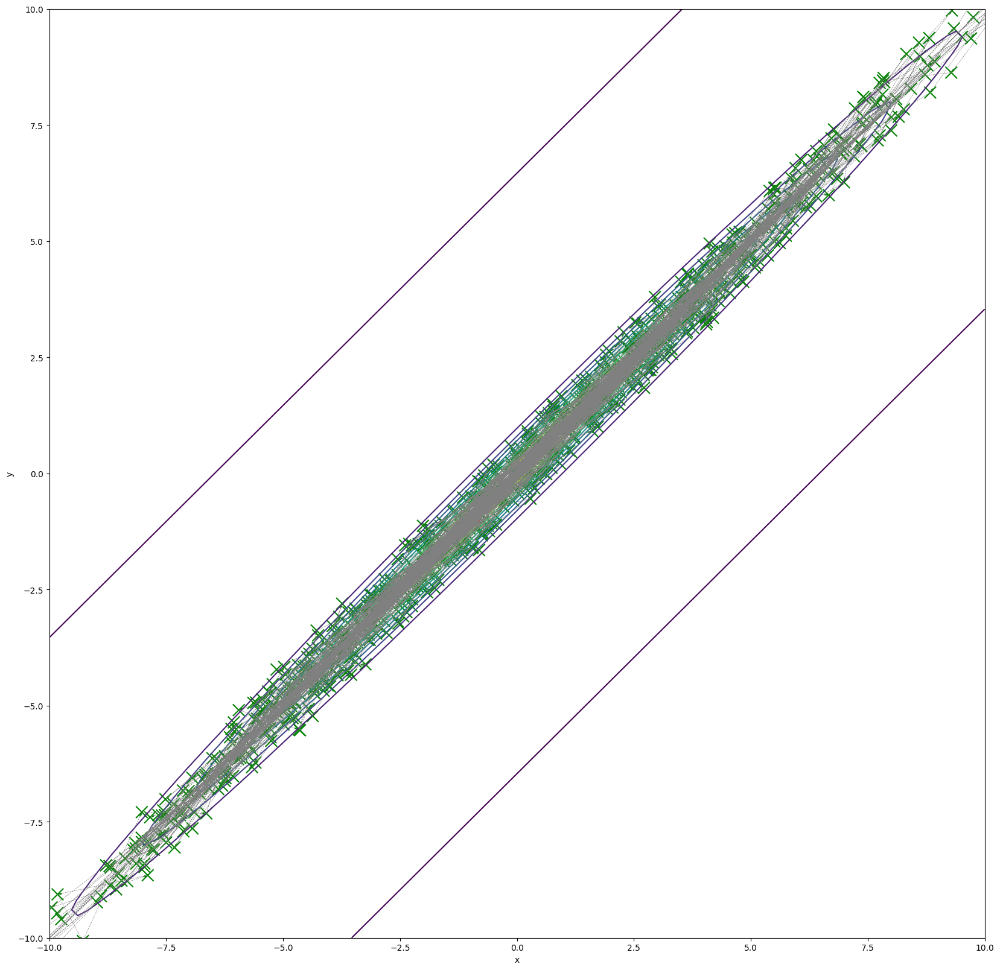

In [163]:
sigma = torch.tensor([[20.,19.9],[19.9,20.]])
mu = torch.tensor([[0.],[0.]])
fX_fn = lambda x: (torch.exp(-1/2*(x-mu).T@ torch.linalg.inv(sigma)@ (x-mu))).diagonal() if x.ndim ==2 else (torch.exp(-1/2*(x-mu).reshape(1,-1)@ torch.linalg.inv(sigma)@ (x-mu).reshape(-1,1))).item()

sampler = HMC(x_dim=2, Epsilon_step=0.05, N_step=100)
# samples, proposals = sampler(fX_fn, N=100, solver='euler')
samples, proposals = sampler(fX_fn, N=1000, solver='leapfrog')


'''Plot the results'''
x = np.linspace(-10,10,100), np.linspace(-10,10,100)
x = np.meshgrid(*x)
x_vecs= torch.tensor(np.stack([x[0].flatten(), x[1].flatten()], axis=0)).float()
f_vals = fX_fn(x_vecs).numpy().reshape(x[0].shape)

plt.figure(figsize=(20,20))
plt.contour(x[0], x[1], f_vals, levels=10)
plt.xlabel("x")
plt.ylabel("y")
plt.xlim(-10,10)
plt.ylim(-10,10)

'''Plot the path of Markov Chain'''
dxs,dys = np.diff(proposals[0][:,0]), np.diff(proposals[0][:,1])
plt.plot([val[0] for val in proposals[0]],[val[1] for val in proposals[0]], '--',  color='0.5', linewidth=0.5)
plt.scatter([val[0] for val in proposals[0]],[val[1] for val in proposals[0]],color=['green' if val=='0.5' else val for val in proposals[1] ], s=200, marker='x')
for x,y,dx,dy,color in zip(proposals[0][:-1,0], proposals[0][:-1,1], dxs[:],dys[:], proposals[1][1:]):
    dx_,dy_ = dx*0.1/(dx**2+dy**2)**0.5,dy*0.1/(dx**2+dy**2)**0.5
    plt.arrow(x,y,dx_,dy_, width=0.01, head_width=0.03, length_includes_head=True, head_length=0.05, color=color)
# plt.grid(True)
# plt.autoscale()

print(np.mean(samples,axis=0), samples.shape[0]/proposals[1].size) 

In [7]:
sigma = torch.tensor([[20.,19.9],[19.9,20.]])
mu = torch.tensor([[0.],[0.]])
fX_fn = lambda x: (torch.exp(-1/2*(x-mu).T@ torch.linalg.inv(sigma)@ (x-mu))).diagonal() if x.ndim ==2 else (torch.exp(-1/2*(x-mu).reshape(1,-1)@ torch.linalg.inv(sigma)@ (x-mu).reshape(-1,1))).item()
# NC_f, expectation = get_NC_expec(fX_fn)


sampler = HMC(x_dim=2, Epsilon_step=0.05, N_step=20)


Ns = [int(10**val) for val in np.linspace(0,4,10)]

expected_values_hmc = [[],[]]
for N in Ns:
    print(f"Expecation using {N} points using HMC sampling...")
    expected_values = [np.mean(sampler(fX_fn, N=N, solver='leapfrog')[0], axis=0) for _ in tqdm(range(20),total=20)]
    expected_values_hmc[0].append(np.full(len(expected_values), N).tolist())
    expected_values_hmc[1].append(expected_values)

Expecation using 1 points using HMC sampling...


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 766.66it/s]


Expecation using 2 points using HMC sampling...


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 106.40it/s]


Expecation using 7 points using HMC sampling...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 23.04it/s]


Expecation using 21 points using HMC sampling...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:02<00:00,  6.95it/s]


Expecation using 59 points using HMC sampling...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:08<00:00,  2.41it/s]


Expecation using 166 points using HMC sampling...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:23<00:00,  1.18s/it]


Expecation using 464 points using HMC sampling...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [01:06<00:00,  3.33s/it]


Expecation using 1291 points using HMC sampling...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [03:04<00:00,  9.25s/it]


Expecation using 3593 points using HMC sampling...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [08:35<00:00, 25.79s/it]


Expecation using 10000 points using HMC sampling...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [24:07<00:00, 72.38s/it]


In [16]:
proposalMC = UniformCircleMarkovChain(R=0.7)

sigma = np.array([[20,19.9],[19.9,20]])
mu = np.array([[0],[0]])
fX_fn = lambda x: (np.exp(-1/2*(x-mu).T@ np.linalg.inv(sigma)@ (x-mu))).diagonal() if x.ndim ==2 else (np.exp(-1/2*(x-mu).reshape(1,-1)@ np.linalg.inv(sigma)@ (x-mu).reshape(-1,1))).item()

samples, proposals = MCC(fX_fn, proposalMC, N=1000)

Ns = [int(10**val) for val in np.linspace(0,6,10)]

expected_values_mcmc = [[],[]]
for N in Ns:
    print(f"Expecation using {N} points using MCMC sampling...")
    expected_values = [np.mean(MCC(fX_fn, proposalMC, N=N)[0], axis=0) for _ in tqdm(range(20),total=20)]
    expected_values_mcmc[0].append(np.full(len(expected_values), N).tolist())
    expected_values_mcmc[1].append(expected_values)

Expecation using 1 points using MCMC sampling...


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 20345.88it/s]


Expecation using 4 points using MCMC sampling...


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 4311.36it/s]


Expecation using 21 points using MCMC sampling...


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 943.04it/s]


Expecation using 100 points using MCMC sampling...


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 241.84it/s]


Expecation using 464 points using MCMC sampling...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 67.45it/s]


Expecation using 2154 points using MCMC sampling...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 15.09it/s]


Expecation using 10000 points using MCMC sampling...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:05<00:00,  3.36it/s]


Expecation using 46415 points using MCMC sampling...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:26<00:00,  1.33s/it]


Expecation using 215443 points using MCMC sampling...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [02:03<00:00,  6.18s/it]


Expecation using 1000000 points using MCMC sampling...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [09:45<00:00, 29.27s/it]


In [17]:
proposalMC = GibbsEachDimensionUniformSampler(R=1)
sigma = np.array([[20,19.9],[19.9,20]])
mu = np.array([[0],[0]])
fX_fn = lambda x: (np.exp(-1/2*(x-mu).T@ np.linalg.inv(sigma)@ (x-mu))).diagonal() if x.ndim ==2 else (np.exp(-1/2*(x-mu).reshape(1,-1)@ np.linalg.inv(sigma)@ (x-mu).reshape(-1,1))).item()

samples, proposals = MCC(fX_fn, proposalMC, N=1000)

Ns = [int(10**val) for val in np.linspace(0,6,10)]

expected_values_gibbs = [[],[]]
for N in Ns:
    print(f"Expecation using {N} points using Gibbs sampling...")
    expected_values = [np.mean(MCC(fX_fn, proposalMC, N=N)[0], axis=0) for _ in tqdm(range(20),total=20)]
    expected_values_gibbs[0].append(np.full(len(expected_values), N).tolist())
    expected_values_gibbs[1].append(expected_values)

Expecation using 1 points using Gibbs sampling...


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 51813.51it/s]


Expecation using 4 points using Gibbs sampling...


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 6331.50it/s]


Expecation using 21 points using Gibbs sampling...


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 1448.46it/s]


Expecation using 100 points using Gibbs sampling...


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 314.93it/s]


Expecation using 464 points using Gibbs sampling...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 79.84it/s]


Expecation using 2154 points using Gibbs sampling...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 18.30it/s]


Expecation using 10000 points using Gibbs sampling...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:04<00:00,  4.02it/s]


Expecation using 46415 points using Gibbs sampling...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:22<00:00,  1.12s/it]


Expecation using 215443 points using Gibbs sampling...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [01:45<00:00,  5.29s/it]


Expecation using 1000000 points using Gibbs sampling...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [07:58<00:00, 23.94s/it]


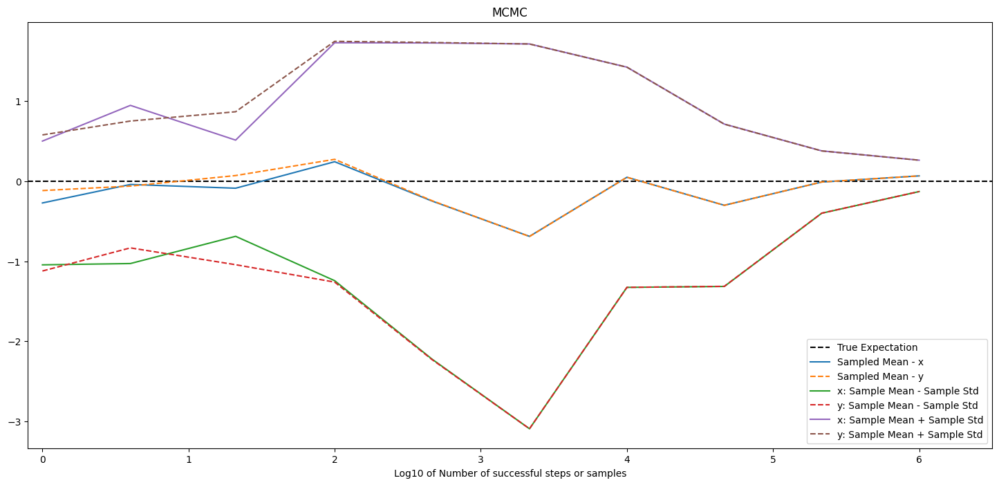

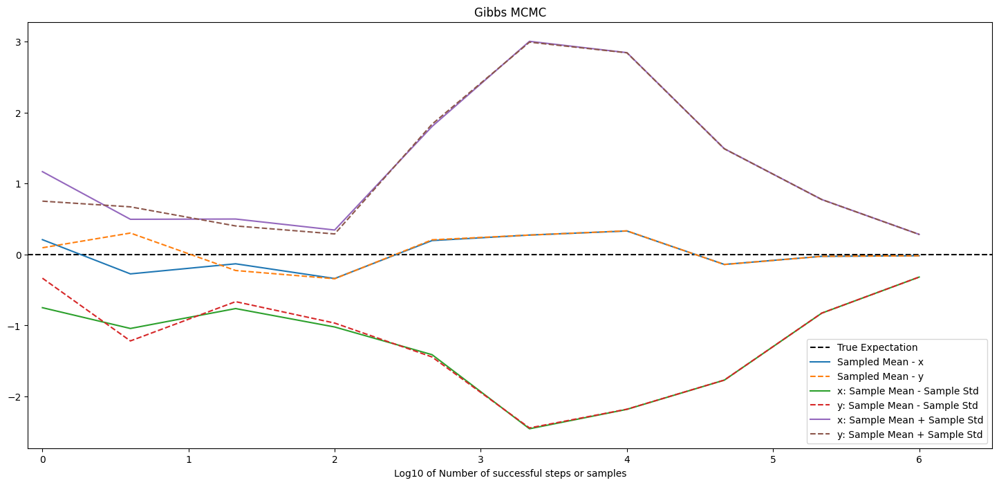

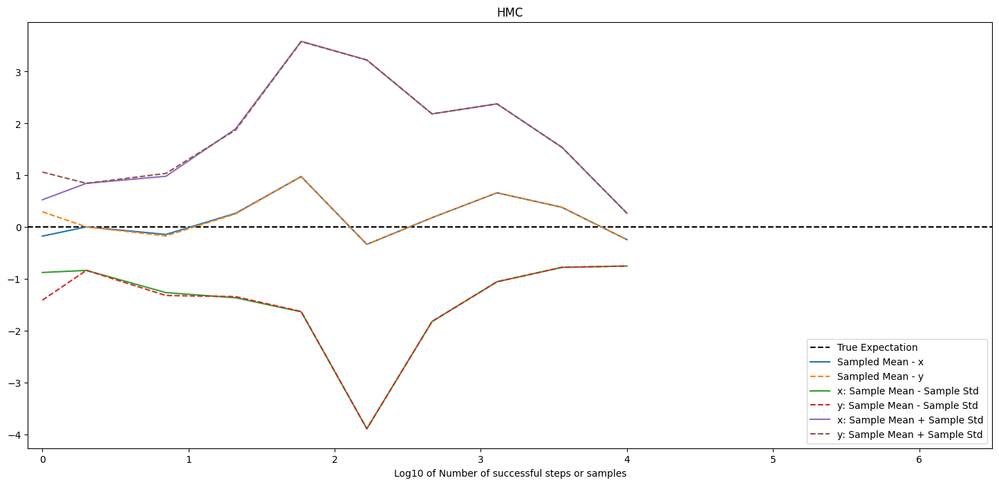

In [24]:
plt.figure(figsize=(18,8))
plt.axhline(y=0, color='black', linestyle='--', label='True Expectation')
plt.plot(np.log10(np.mean(expected_values_mcmc[0], axis=1)), np.mean(expected_values_mcmc[1], axis=1)[:,0], label='Sampled Mean - x')
plt.plot(np.log10(np.mean(expected_values_mcmc[0], axis=1)), np.mean(expected_values_mcmc[1], axis=1)[:,1], label='Sampled Mean - y', linestyle='--')
plt.plot(np.log10(np.mean(expected_values_mcmc[0], axis=1)), np.mean(expected_values_mcmc[1], axis=1)[:,0]-np.std(expected_values_mcmc[1], axis=1)[:,0], label='x: Sample Mean - Sample Std')
plt.plot(np.log10(np.mean(expected_values_mcmc[0], axis=1)), np.mean(expected_values_mcmc[1], axis=1)[:,0]-np.std(expected_values_mcmc[1], axis=1)[:,1], label='y: Sample Mean - Sample Std', linestyle='--')
plt.plot(np.log10(np.mean(expected_values_mcmc[0], axis=1)), np.mean(expected_values_mcmc[1], axis=1)[:,0]+np.std(expected_values_mcmc[1], axis=1)[:,0], label='x: Sample Mean + Sample Std')
plt.plot(np.log10(np.mean(expected_values_mcmc[0], axis=1)), np.mean(expected_values_mcmc[1], axis=1)[:,0]+np.std(expected_values_mcmc[1], axis=1)[:,1], label='y: Sample Mean + Sample Std', linestyle='--')
plt.legend(loc='lower right')
plt.xlim(-0.1,6.5)
plt.xlabel("Log10 of Number of successful steps or samples")
plt.title('MCMC')
plt.show()

plt.figure(figsize=(18,8))
plt.axhline(y=0, color='black', linestyle='--', label='True Expectation')
plt.plot(np.log10(np.mean(expected_values_gibbs[0], axis=1)), np.mean(expected_values_gibbs[1], axis=1)[:,0], label='Sampled Mean - x')
plt.plot(np.log10(np.mean(expected_values_gibbs[0], axis=1)), np.mean(expected_values_gibbs[1], axis=1)[:,1], label='Sampled Mean - y', linestyle='--')
plt.plot(np.log10(np.mean(expected_values_gibbs[0], axis=1)), np.mean(expected_values_gibbs[1], axis=1)[:,0]-np.std(expected_values_gibbs[1], axis=1)[:,0], label='x: Sample Mean - Sample Std')
plt.plot(np.log10(np.mean(expected_values_gibbs[0], axis=1)), np.mean(expected_values_gibbs[1], axis=1)[:,0]-np.std(expected_values_gibbs[1], axis=1)[:,1], label='y: Sample Mean - Sample Std', linestyle='--')
plt.plot(np.log10(np.mean(expected_values_gibbs[0], axis=1)), np.mean(expected_values_gibbs[1], axis=1)[:,0]+np.std(expected_values_gibbs[1], axis=1)[:,0], label='x: Sample Mean + Sample Std')
plt.plot(np.log10(np.mean(expected_values_gibbs[0], axis=1)), np.mean(expected_values_gibbs[1], axis=1)[:,0]+np.std(expected_values_gibbs[1], axis=1)[:,1], label='y: Sample Mean + Sample Std', linestyle='--')
plt.legend(loc='lower right')
plt.xlim(-0.1,6.5)
plt.xlabel("Log10 of Number of successful steps or samples")
plt.title('Gibbs MCMC')
plt.show()

plt.figure(figsize=(18,8))
plt.axhline(y=0, color='black', linestyle='--', label='True Expectation')
plt.plot(np.log10(np.mean(expected_values_hmc[0], axis=1)), np.mean(expected_values_hmc[1], axis=1)[:,0], label='Sampled Mean - x')
plt.plot(np.log10(np.mean(expected_values_hmc[0], axis=1)), np.mean(expected_values_hmc[1], axis=1)[:,1], label='Sampled Mean - y', linestyle='--')
plt.plot(np.log10(np.mean(expected_values_hmc[0], axis=1)), np.mean(expected_values_hmc[1], axis=1)[:,0]-np.std(expected_values_hmc[1], axis=1)[:,0], label='x: Sample Mean - Sample Std')
plt.plot(np.log10(np.mean(expected_values_hmc[0], axis=1)), np.mean(expected_values_hmc[1], axis=1)[:,0]-np.std(expected_values_hmc[1], axis=1)[:,1], label='y: Sample Mean - Sample Std', linestyle='--')
plt.plot(np.log10(np.mean(expected_values_hmc[0], axis=1)), np.mean(expected_values_hmc[1], axis=1)[:,0]+np.std(expected_values_hmc[1], axis=1)[:,0], label='x: Sample Mean + Sample Std')
plt.plot(np.log10(np.mean(expected_values_hmc[0], axis=1)), np.mean(expected_values_hmc[1], axis=1)[:,0]+np.std(expected_values_hmc[1], axis=1)[:,1], label='y: Sample Mean + Sample Std', linestyle='--')
plt.legend(loc='lower right')
plt.xlim(-0.1,6.5)
plt.xlabel("Log10 of Number of successful steps or samples")
plt.title('HMC')
plt.show()